# 0. Setup & Data Load

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

df_raw = pd.read_csv(r"C:\Users\argon\Documents\Desktop Prime\MS Business Analytics\Fall Semester\Marketing Analytics\Modified_Telco_Customer_Churn_Updated.csv")

print('Structure Check')

print(df_raw.shape)
print(df_raw.dtypes.value_counts())

print('Basic Info')

#df.info()
df_raw.describe(include = 'all').T

Structure Check
(7043, 22)
int64      15
object      4
float64     3
Name: count, dtype: int64
Basic Info


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customerID,7043,7043,7590-VHVEG,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,7043.0,NaN,NaN,NaN,0.504756,0.500013,0.0,0.0,1.0,1.0,1.0
SeniorCitizen,7043.0,NaN,NaN,NaN,0.162147,0.368612,0.0,0.0,0.0,0.0,1.0
Partner,7043.0,NaN,NaN,NaN,0.483033,0.499748,0.0,0.0,0.0,1.0,1.0
Dependents,7043.0,NaN,NaN,NaN,0.299588,0.45811,0.0,0.0,0.0,1.0,1.0
tenure,7043.0,NaN,NaN,NaN,32.371149,24.559481,0.0,9.0,29.0,55.0,72.0
PhoneService,7043.0,NaN,NaN,NaN,0.903166,0.295752,0.0,1.0,1.0,1.0,1.0
MultipleLines,7043.0,NaN,NaN,NaN,0.421837,0.493888,0.0,0.0,0.0,1.0,1.0
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043.0,NaN,NaN,NaN,0.286668,0.452237,0.0,0.0,0.0,1.0,1.0


# 1. Cleaning & EDA

## 1.1 Quick Structure Checks

In [2]:
df_clean = df_raw.copy()

# Handling infinities

df_clean.replace([np.inf, -np.inf], np.nan, inplace = True)
df_clean['AvgChargesPerMonth'] = df_clean['AvgChargesPerMonth'].fillna(0)

# Drop duplicates if any

df_clean = df_clean.drop_duplicates()

# Quick checks

print('Remaining NaNs:\n', df_clean.isna().sum().sort_values(ascending = False))
print('Shape after cleaning:\n', df_clean.shape)

Remaining NaNs:
 customerID            0
gender                0
AvgChargesPerMonth    0
Churn                 0
TotalCharges          0
PaymentMethod         0
PaperlessBilling      0
Contract              0
StreamingMovies       0
StreamingTV           0
TechSupport           0
DeviceProtection      0
OnlineBackup          0
OnlineSecurity        0
InternetService       0
MultipleLines         0
PhoneService          0
tenure                0
Dependents            0
Partner               0
SeniorCitizen         0
MonthlyCharges        0
dtype: int64
Shape after cleaning:
 (7043, 22)


In [5]:
# Summary stats for numeric variables
summary_stats = df_eda[["tenure", "MonthlyCharges", "TotalCharges", "AvgChargesPerMonth"]].agg(
    ["mean", "median", "var", "std", "skew", "kurtosis"]
).T

summary_stats


,mean,median,var,std,skew,kurtosis
tenure,32.371149,29.00,6.031681e+02,24.559481,0.239540,-1.387372
MonthlyCharges,64.747559,70.35,9.039674e+02,30.066050,-0.223712,-1.261332
TotalCharges,2283.300441,1400.55,5.130226e+06,2265.000258,0.962394,-0.227468
AvgChargesPerMonth,64.698218,70.30,9.163134e+02,30.270670,-0.214327,-1.239089


In [6]:
# Select numerical variables

num_vars = ['tenure', 'MonthlyCharges', 'TotalCharges', 'AvgChargesPerMonth']

# Group by Churn

grouped_stats = df_eda.groupby('Churn_str')[num_vars].apply(
    lambda g: pd.DataFrame({
        'mean': g.mean(),
        'median': g.median(),
        'var': g.var(),
        'std': g.std(),
        'skew': g.skew(),
        'kurtosis': g.kurtosis()
    })
).T

grouped_stats

Churn_str          No                                                  \
               tenure MonthlyCharges  TotalCharges AvgChargesPerMonth   
mean        37.569965      61.248325  2.554766e+03          61.181674   
median      38.000000      64.425000  1.689175e+03          63.909219   
var        581.474226     964.920559  5.414988e+06         975.776943   
std         24.113777      31.063170  2.327013e+03          31.237429   
skew        -0.031720      -0.028469  8.073066e-01          -0.024279   
kurtosis    -1.413772      -1.360824 -5.471590e-01          -1.334898   

Churn_str         Yes                                                  
               tenure MonthlyCharges  TotalCharges AvgChargesPerMonth  
mean        17.979133      74.434577  1.531796e+03          74.433154  
median      10.000000      79.650000  7.035500e+02          79.312500  
var        381.464768     607.851516  3.575212e+06         623.061959  
std         19.531123      24.654645  1.890823e+03          24.961209  
skew         1.149280      -0.731911  1.510915e+00          -0.698265  
kurtosis     0.196250      -0.362725  1.461704e+00          -0.388280

## 1.2 Feature Engineering - I

In [3]:
df_eda = df_clean.copy()

In [4]:
# Gender special case

df_eda['Gender_str'] = df_eda['gender'].map({0: 'Female', 1: 'Male'})

# Generic yes/no mapping

binary_map = {0: 'No', 1: 'Yes'}

# Apply to other binary columns

for col in ['Churn', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling',
           'SeniorCitizen', 'PhoneService','MultipleLines', 'OnlineSecurity',
           'OnlineBackup', 'DeviceProtection', 'TechSupport',
           'StreamingTV', 'StreamingMovies']:
    new_col = col + "_str"
    df_eda[new_col] = df_eda[col].map(binary_map)
label_map = {
    "Gender_str": "Gender",
    "Partner_str": "Partner Status",
    "Dependents_str": "Dependent Status",
    "SeniorCitizen_str": "Senior Citizen",
    "PhoneService_str": "Phone Service",
    "PaperlessBilling_str": "Paperless Billing",
    "PaymentMethod": "Payment Method",
    "Contract": "Contract Type",
    "InternetService": "Internet Service",
    "Churn_str": "Churn",
    "tenure": "Tenure (Months)",
    "MonthlyCharges": "Monthly Charges ($)",
    "TotalCharges": "Total Charges ($)",
    "AvgChargesPerMonth": "Average Monthly Charges ($)"
}

## 1.3 Distributions and Churn Overlays

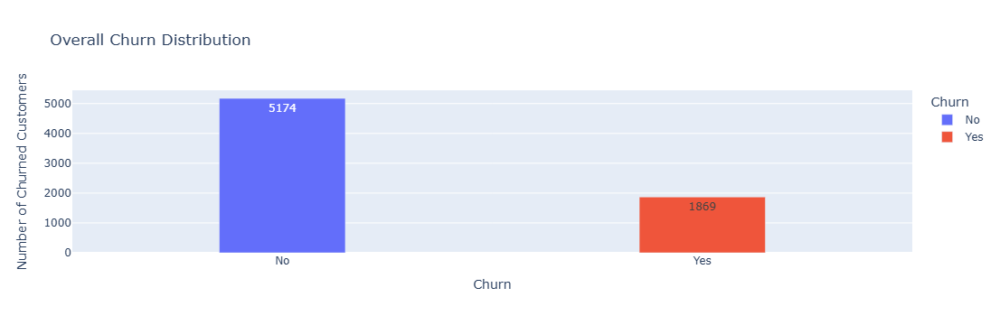

In [7]:
churn_counts = df_eda['Churn_str'].value_counts().reset_index()
churn_counts.columns = ['Churn', 'Count']

fig = px.bar(
    churn_counts,
    x = 'Churn',
    y = 'Count',
    color = 'Churn',
    text_auto = True,
    title = 'Overall Churn Distribution'
)

fig.update_layout(
    yaxis_title = 'Number of Churned Customers',
    bargap = 0.7
)

fig.show()

### Categorical Plots

In [8]:
def plot_cat_bar(feature):
    counts = df_eda.groupby([feature, 'Churn_str']).size().reset_index(name = 'Count')

    fig = px.bar(
        counts,
        x = feature,
        y= 'Count',
        color = 'Churn_str',
        barmode = 'group',
        text_auto = True,
        category_orders = {'Churn_str': ['No', 'Yes']}
    )

    fig.update_layout(
        title = f"Customer Churn by {label_map.get(feature, feature)}",
        xaxis_title = label_map.get(feature, feature),
        yaxis_title = 'Number of Customers',
        legend_title_text = 'Churn',
        bargap = 0.7
    )

    fig.show()

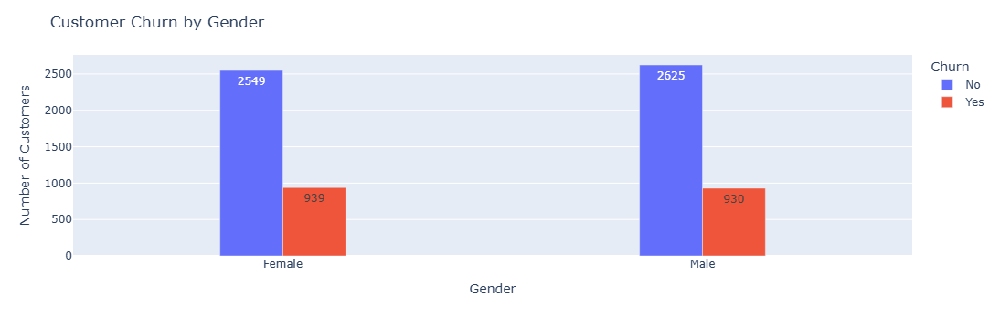

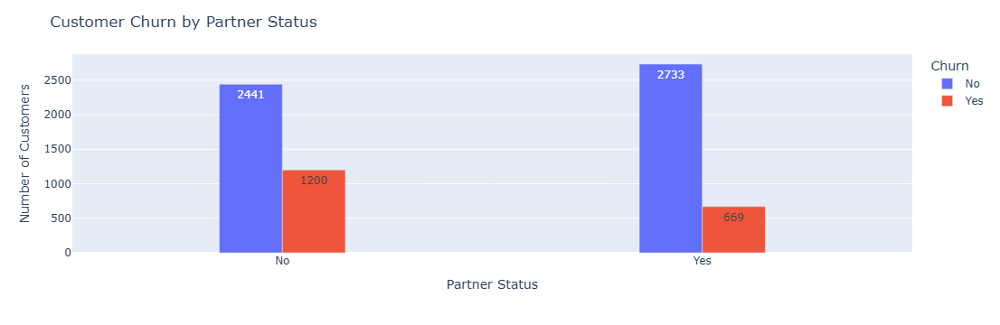

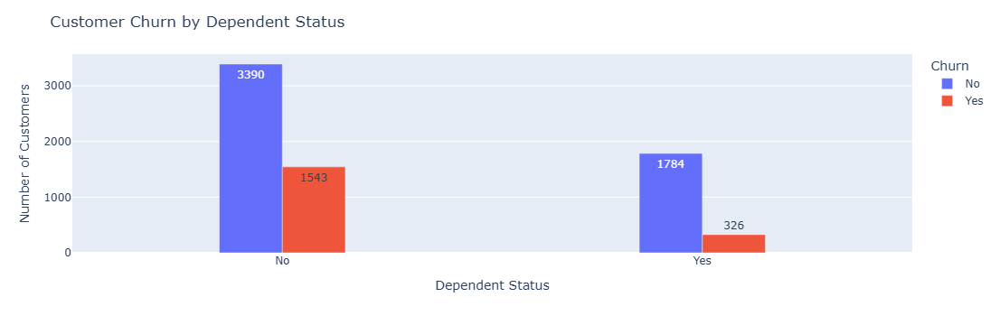

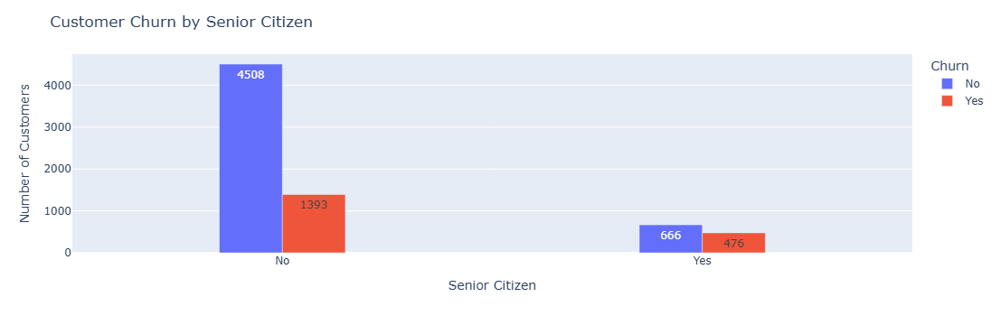

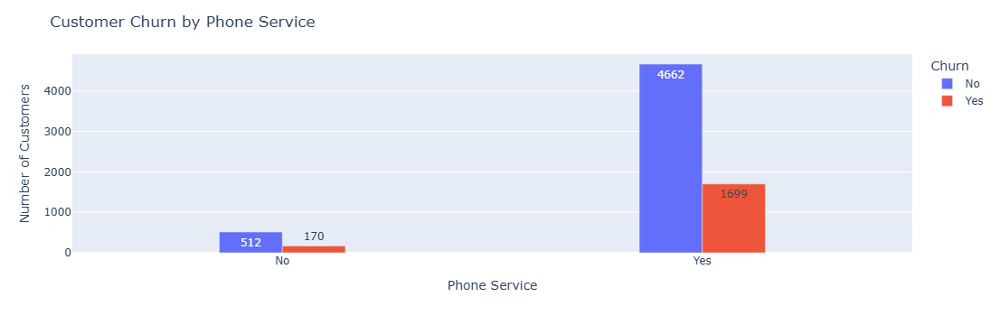

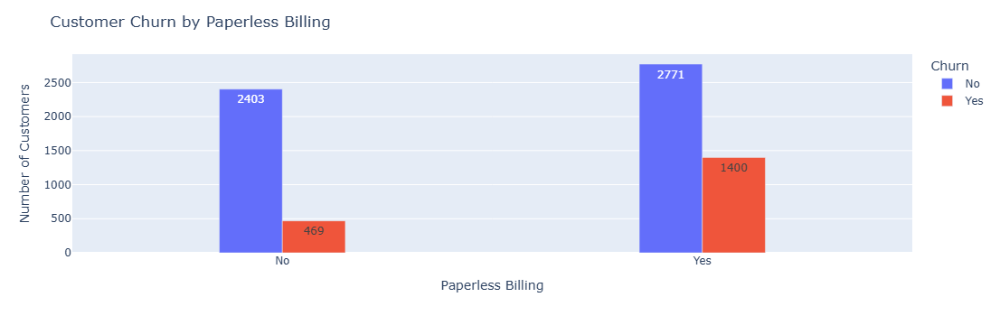

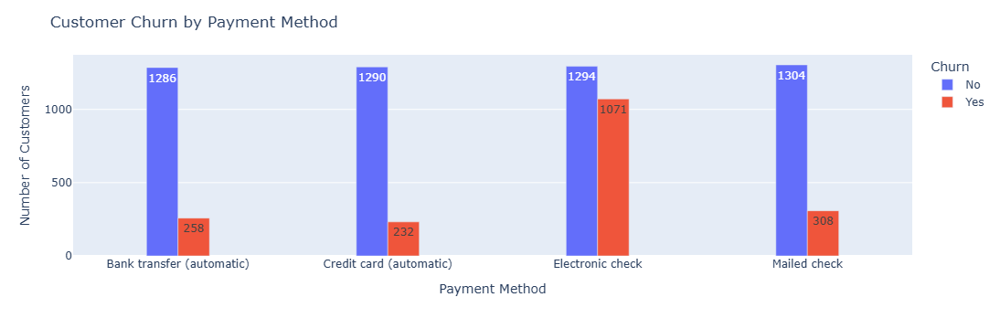

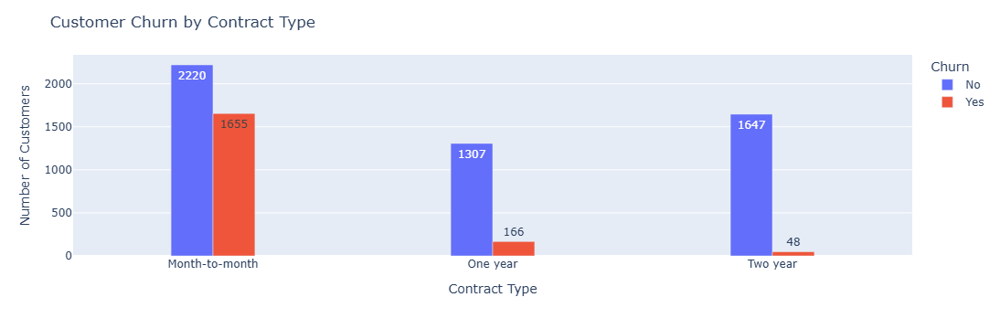

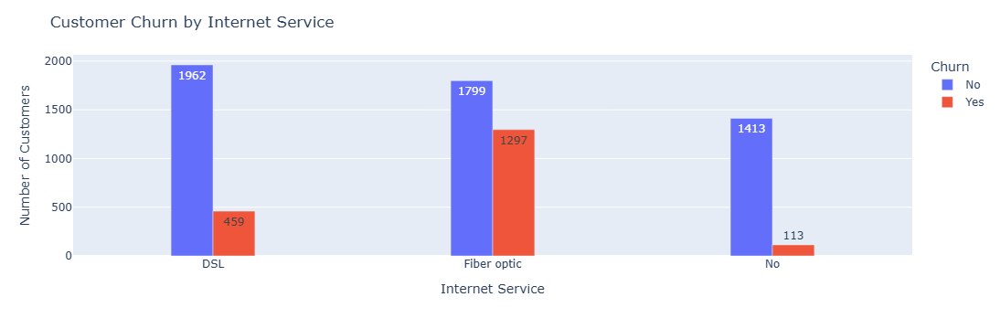

In [9]:
# Categorical variables

categorical_vars = [
    'Gender_str', 'Partner_str', 'Dependents_str', 'SeniorCitizen_str',
    'PhoneService_str', 'PaperlessBilling_str', 'PaymentMethod', 'Contract',
    'InternetService'
]

for cat in categorical_vars:
    plot_cat_bar(cat)

### Numerical Plots

In [10]:
def plot_num_hist(feature):
    fig = px.histogram(
        df_eda,
        x = feature,
        color = 'Churn_str',
        nbins = 50,
        marginal = 'box',
        barmode = 'overlay',
        category_orders = {'Churn_str': ['No', 'Yes']}
    )

    fig.update_layout(
        title = f'Distribution of {label_map.get(feature, feature)} by Churn',
        xaxis_title = label_map.get(feature, feature),
        yaxis_title = 'Number of Customers',
        legend_title_text = 'Churn'
    )

    fig.show()

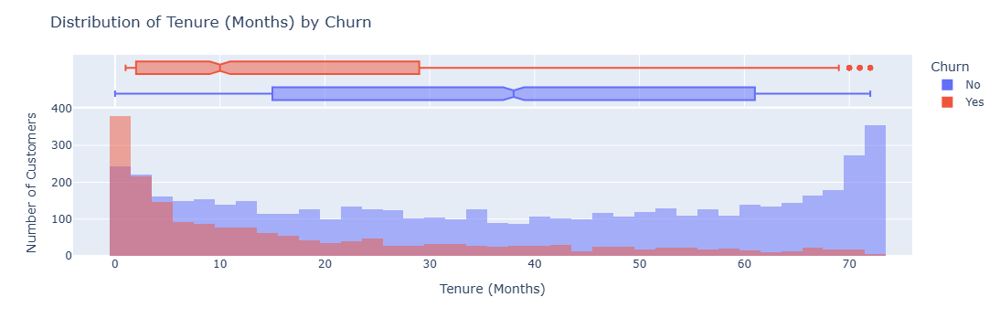

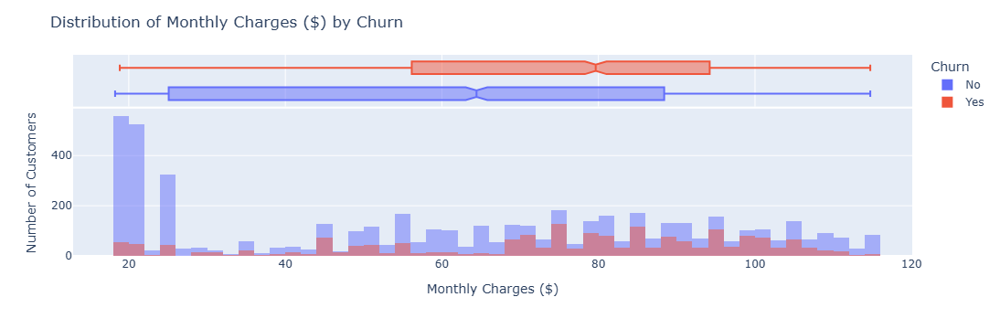

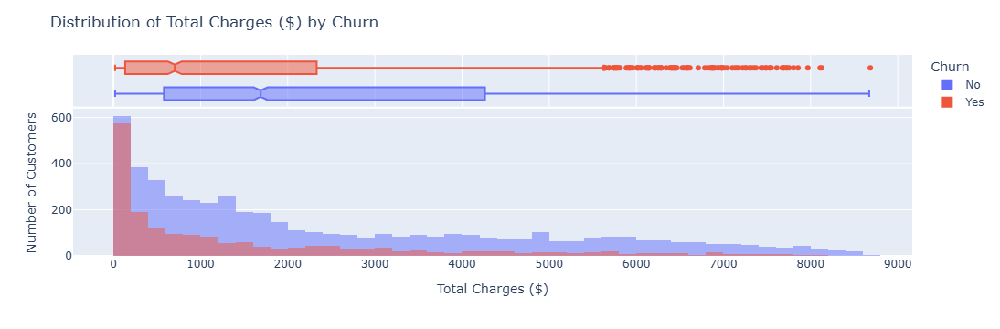

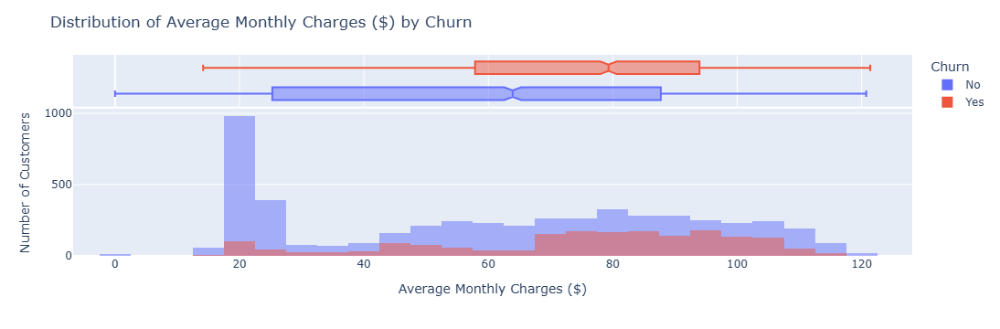

In [11]:
# Numerical feature distributions with churn overlay

numerical_vars = ['tenure', 'MonthlyCharges', "TotalCharges", "AvgChargesPerMonth"]

for num in numerical_vars:
    plot_num_hist(num)

### Relationships

In [13]:
def plot_scatter(x, y, title = None):
    fig = px.scatter(
        df_eda,
        x = x,
        y = y,
        color = 'Churn_str',
        hover_data = ['Contract', 'PaymentMethod'],
        category_orders = {'Churn_str': ['No', 'Yes']} 
    )

    fig.update_layout(
        title = title or f'{label_map.get(y, y)} vs {label_map.get(x, x)} by Churn',
        xaxis_title = label_map.get(x, x),
        yaxis_title = label_map.get(y, y),
        legend_title_text = 'Churn'
    )

    fig.show()

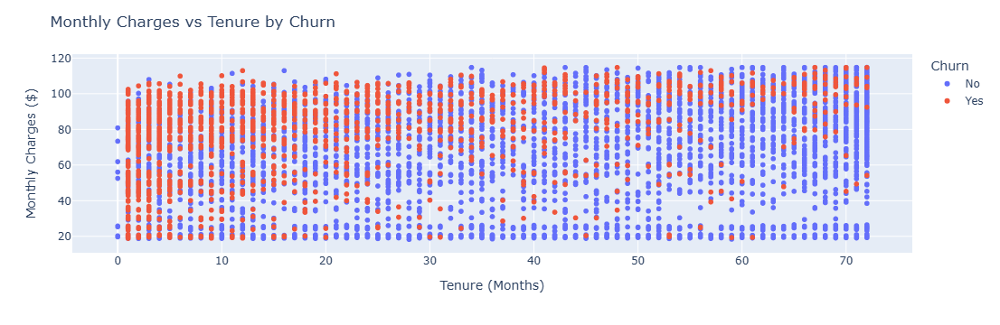

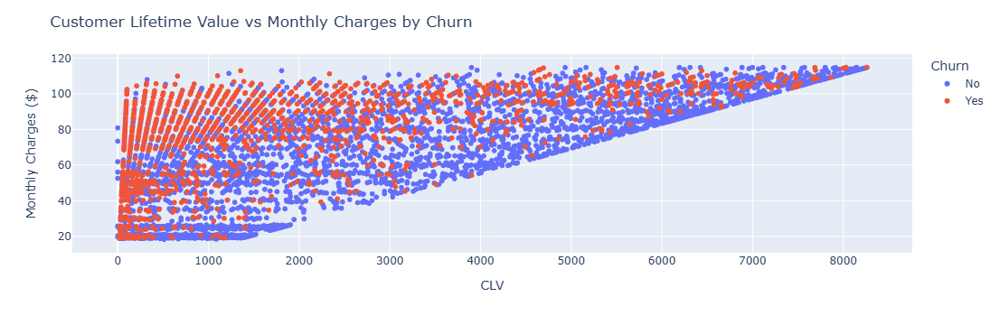

In [14]:
# Compute CLV if not already done
df_eda["CLV"] = df_eda["tenure"] * df_eda["MonthlyCharges"]

plot_scatter("tenure", "MonthlyCharges", "Monthly Charges vs Tenure by Churn")
plot_scatter("CLV", "MonthlyCharges", "Customer Lifetime Value vs Monthly Charges by Churn")


### Correlation Heatmaps

In [15]:
# Compute correlation

num_vars = ['tenure', 'MonthlyCharges', 'TotalCharges', 'AvgChargesPerMonth']
corr_matrix = df_eda[num_vars].corr()

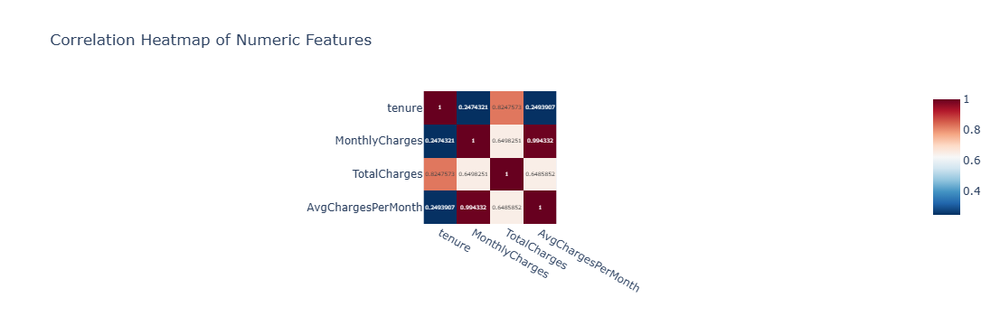

In [16]:
# Plot heatmap

fig = px.imshow(
    corr_matrix,
    text_auto = True,
    color_continuous_scale = 'RdBu_r',
    title = 'Correlation Heatmap of Numeric Features'
)

fig.update_layout(
    xaxis_title = '',
    yaxis_title = ''
)

fig.show()

### Facet Grid: Internet Service, Contract-type, Churn

In [17]:
def plot_cat_facet(cat_x, facet_by, df = df_eda, label_map = label_map):
    fig = px.histogram(
        df,
        x = cat_x,
        color = 'Churn_str',
        barmode = 'group',
        facet_col = facet_by,
        category_orders = {'Churn_str': ['No', 'Yes']}
    )

    fig.update_layout(
        title = f'Churn by {label_map.get(cat_x, cat_x)} Faceted by {label_map.get(facet_by, facet_by)}',
        xaxis_title = label_map.get(cat_x, cat_x),
        yaxis_title = 'Number of Customers',
        legend_title_text = 'Churn'
    )

    fig.show()

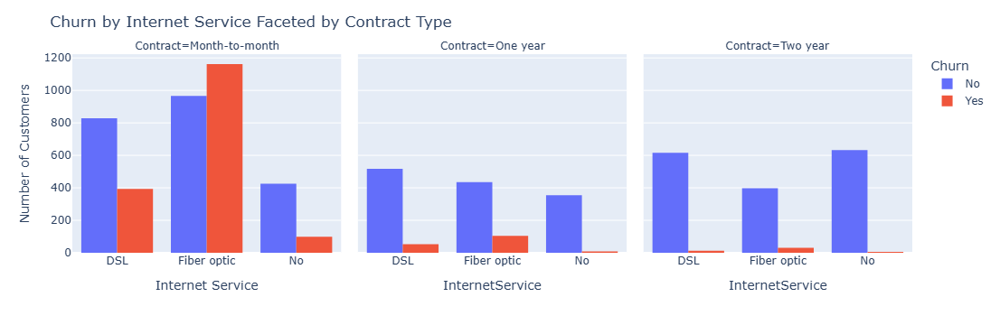

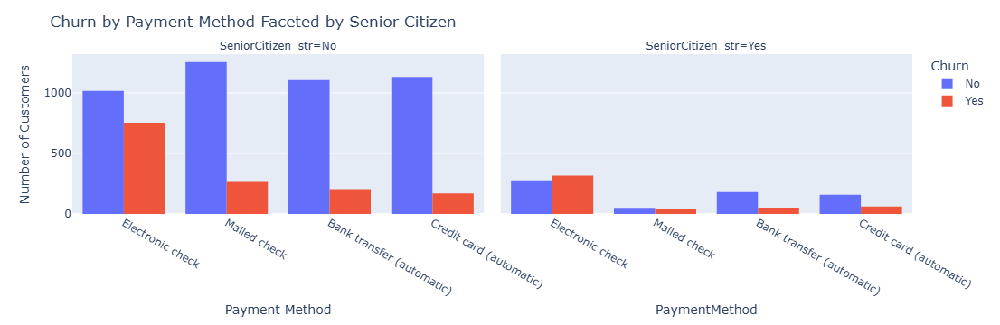

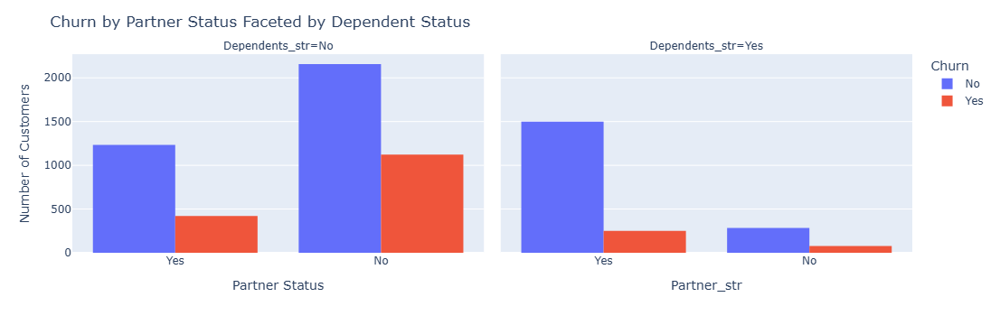

In [19]:
plot_cat_facet("InternetService", "Contract")
plot_cat_facet("PaymentMethod", "SeniorCitizen_str")
plot_cat_facet("Partner_str", "Dependents_str")


## 1.4 Feature Engineering - II

In [20]:
df_model = df_clean.copy()

# Add engineered interaction features
df_model["Contract_Internet"] = df_model["Contract"].astype(str) + "_" + df_model["InternetService"].astype(str)
df_model["Payment_Senior"] = df_model["PaymentMethod"].astype(str) + "_" + df_model["SeniorCitizen"].astype(str)

# Family support score (0 = no partner/dependents, 2 = both)
df_model["FamilySupport"] = df_model["Partner"] + df_model["Dependents"]


# 2. Modeling: Global (No Clustering)

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score

In [22]:
# Define target + features

target = 'Churn'
X = df_model.drop(columns = [target, 'customerID'])
y = df_model[target]

# Split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size = 0.3, random_state = 42, stratify = y
)

# Identify categorical vs numeric features

cat_features = X.select_dtypes(include = ['object']).columns.tolist()
num_features = X.select_dtypes(include = ['int64', 'float64']).columns.tolist()

In [23]:
# Preprocessing

preprocessor = ColumnTransformer(
    transformers = [
        ('num', StandardScaler(), num_features),
        ('cat', OneHotEncoder(drop = 'first'), cat_features)
    ]
)

## Logistic Regression Pipeline

In [24]:
# Pipeline

logreg = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter = 500, solver = 'liblinear'))
])

# Train

logreg.fit(X_train, y_train)

# Predict

y_pred = logreg.predict(X_test)
y_proba = logreg.predict_proba(X_test)[:,1]

# Evaluation

print(classification_report(y_test, y_pred))
print('ROC AUC:', roc_auc_score(y_test, y_proba))

              precision    recall  f1-score   support

           0       0.85      0.90      0.87      1552
           1       0.66      0.55      0.60       561

    accuracy                           0.81      2113
   macro avg       0.76      0.73      0.74      2113
weighted avg       0.80      0.81      0.80      2113

ROC AUC: 0.844857190767591


## Interpret Feature Impact

In [25]:
# Get feature names from pipeline

ohe = logreg.named_steps['preprocessor'].named_transformers_['cat']
encoded_features = ohe.get_feature_names_out(cat_features)
all_features = num_features + list(encoded_features)

coefs = pd.DataFrame({
    'Feature': all_features,
    'Coefficient': logreg.named_steps['classifier'].coef_[0]
}).sort_values(by = 'Coefficient', ascending = False)

coefs.head(15)

,Feature,Coefficient
14,TotalCharges,0.599551
18,InternetService_Fiber optic,0.414662
39,Payment_Senior_Mailed check_1,0.359536
25,Contract_Internet_Month-to-month_Fiber optic,0.325345
15,AvgChargesPerMonth,0.225745
13,PaperlessBilling,0.199930
36,Payment_Senior_Electronic check_0,0.177785
24,PaymentMethod_Mailed check,0.153016
23,PaymentMethod_Electronic check,0.150496
6,MultipleLines,0.146071


## 2.1 Preprocessor & collinearity tools (VIF)

In [51]:
# --- Preprocessing ---
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

def make_preprocessor(X):
    bool_cols = X.select_dtypes(include=['bool']).columns.tolist()
    num_cols  = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cat_cols  = X.select_dtypes(include=['object']).columns.tolist() + bool_cols

    # Backward/forward compatible way to force dense output
    ohe_kwargs = dict(drop='first', handle_unknown='ignore')
    try:
        # sklearn >=1.2
        OneHotEncoder().get_params()
        if 'sparse_output' in OneHotEncoder().get_params():
            ohe_kwargs['sparse_output'] = False
        else:
            ohe_kwargs['sparse'] = False  # sklearn <1.2
    except Exception:
        ohe_kwargs['sparse'] = False

    pre = ColumnTransformer(
        [
            ('num', StandardScaler(), num_cols),
            ('cat', OneHotEncoder(**ohe_kwargs), cat_cols),
        ],
        remainder='drop',
    )
    return pre, num_cols, cat_cols


In [95]:
# === Global supervised preprocessor (fit once on TRAIN) ===
preprocessor, num_features, cat_features = make_preprocessor(X_train)
preprocessor.fit(X_train)  # important: fit before using names or cloning for clusters
pre_feat_names = get_feature_names_from_column_transformer(preprocessor)


### Collinearity Utilities

In [70]:
# --- Collinearity Utilities (VIF with intercept) ---
import numpy as np
import pandas as pd
import warnings
from sklearn.base import BaseEstimator, TransformerMixin
from statsmodels.stats.outliers_influence import variance_inflation_factor

class VIFSelector(BaseEstimator, TransformerMixin):
    """
    Iteratively removes features with VIF > threshold on a numeric design matrix.
    - Drops zero/near-zero variance columns first.
    - Computes VIFs on a design matrix with an intercept (constant term),
      which is the textbook definition.
    """
    def __init__(self, threshold=10.0, max_iter=20, feature_names=None,
                 verbose=False, zero_var_eps=1e-12, add_intercept=True, jitter=1e-12):
        # store init args so sklearn.get_params works
        self.threshold = float(threshold)
        self.max_iter = int(max_iter)
        self.feature_names = feature_names
        self.verbose = verbose
        self.zero_var_eps = float(zero_var_eps)
        self.add_intercept = bool(add_intercept)
        self.jitter = float(jitter)

        # runtime
        self.feature_names_ = feature_names
        self.keep_indices_ = None
        self.dropped_indices_ = []
        self.vif_table_ = None
        self.dropped_features_ = []
        self.dropped_zero_var_ = []

    def _maybe_names(self, idx_list):
        names = self.feature_names_
        if names is None:
            return idx_list
        return [names[i] for i in idx_list]

    def _compute_vifs(self, X2d):
        """Return a list of VIFs for each column of X2d, using an intercept if requested."""
        Xw = X2d + self.jitter * np.random.randn(*X2d.shape)  # tiny jitter
        if self.add_intercept:
            Xw = np.column_stack([np.ones(Xw.shape[0]), Xw])
        vifs = []
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", RuntimeWarning)
            for j in range(X2d.shape[1]):
                idx = j + 1 if self.add_intercept else j
                try:
                    v = variance_inflation_factor(Xw, idx)
                    if not np.isfinite(v):
                        v = np.inf
                except Exception:
                    v = np.inf
                vifs.append(float(v))
        return vifs

    def fit(self, X, y=None):
        X = np.asarray(X)
        n_cols = X.shape[1]

        # sync names length with actual columns (can differ per CV fold)
        if (self.feature_names_ is not None) and (len(self.feature_names_) != n_cols):
            self.feature_names_ = None
            self.feature_names = None

        # 1) drop zero / near-zero variance columns
        stds = np.nanstd(X, axis=0)
        initial_keep = [i for i in range(n_cols) if stds[i] > self.zero_var_eps]
        dropped_zero_var = [i for i in range(n_cols) if stds[i] <= self.zero_var_eps]

        if self.verbose and dropped_zero_var:
            print(f"[VIFSelector] Dropping {len(dropped_zero_var)} zero-variance columns before VIF.")

        keep = initial_keep.copy()
        dropped = dropped_zero_var.copy()

        # 2) iterative VIF pruning
        if len(keep) > 1:
            for _ in range(self.max_iter):
                if len(keep) <= 1:
                    break

                X_keep = X[:, keep]
                # re-check zero variance after previous removals
                stds_keep = np.nanstd(X_keep, axis=0)
                zero_local = [j for j, s in enumerate(stds_keep) if s <= self.zero_var_eps]
                if zero_local:
                    for j in sorted(zero_local, reverse=True):
                        dropped.append(keep[j])
                        keep.pop(j)
                    if len(keep) <= 1:
                        break
                    X_keep = X[:, keep]

                vifs = self._compute_vifs(X_keep)
                max_vif = float(np.nanmax(vifs))
                max_idx_local = int(np.nanargmax(vifs))

                if self.verbose:
                    print(f"[VIFSelector] Max VIF={max_vif:.3f} @ local idx {max_idx_local}")

                if max_vif > self.threshold:
                    drop_global_idx = keep[max_idx_local]
                    dropped.append(drop_global_idx)
                    keep.pop(max_idx_local)
                else:
                    break

        # Save results
        self.keep_indices_ = keep
        self.dropped_indices_ = dropped

        # Final VIF table on kept set
        if len(keep) >= 1:
            X_final = X[:, keep]
            vifs_final = self._compute_vifs(X_final)
            kept_names = self._maybe_names(keep)
            self.vif_table_ = pd.DataFrame({"feature": kept_names, "VIF": vifs_final}) \
                                  .sort_values("VIF", ascending=False).reset_index(drop=True)
        else:
            self.vif_table_ = pd.DataFrame(columns=["feature", "VIF"])

        # Human-readable dropped lists
        self.dropped_zero_var_ = self._maybe_names(dropped_zero_var)
        dropped_vif_only = sorted(set(dropped) - set(dropped_zero_var))
        self.dropped_features_ = self._maybe_names(dropped_vif_only)
        return self

    def transform(self, X):
        X = np.asarray(X)
        if not self.keep_indices_:
            return X[:, []]
        return X[:, self.keep_indices_]

    def get_support(self, indices=False):
        if indices:
            return self.keep_indices_
        n = len(self.feature_names_) if self.feature_names_ else (max(self.keep_indices_) + 1 if self.keep_indices_ else 0)
        mask = np.zeros((n,), dtype=bool)
        if self.keep_indices_:
            mask[self.keep_indices_] = True
        return mask


In [120]:
# === Utility: FeatureCountAligner ===
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class FeatureCountAligner(BaseEstimator, TransformerMixin):
    """
    Records the number of columns at fit-time and, at transform-time,
    pads with zeros (or trims) so the downstream classifier always
    receives the same feature count it was trained on.

    This is especially useful for XGBoost inside clustered pipelines.
    """
    def __init__(self):
        self.n_features_ = None

    def fit(self, X, y=None):
        X = np.asarray(X)
        self.n_features_ = X.shape[1]
        return self

    def transform(self, X):
        X = np.asarray(X)
        if self.n_features_ is None:
            return X
        n_now, n_expected = X.shape[1], self.n_features_
        if n_now == n_expected:
            return X
        if n_now < n_expected:
            pad = np.zeros((X.shape[0], n_expected - n_now), dtype=X.dtype)
            return np.hstack([X, pad])
        # n_now > n_expected
        return X[:, :n_expected]


In [133]:
# --- XGB wrapper that guarantees feature-shape alignment at predict time ---
import numpy as np
from sklearn.base import BaseEstimator, ClassifierMixin
from xgboost import XGBClassifier

class XGBWithAlign(BaseEstimator, ClassifierMixin):
    """
    Wrapper around XGBClassifier that:
      - records expected number of features at fit (from booster)
      - pads/trims input at predict_proba to that size
      - calls predict_proba(validate_features=False) to avoid strict checks
    """
    def __init__(self, **xgb_params):
        self.xgb_params = xgb_params
        self.inner_ = XGBClassifier(**xgb_params)
        self.n_features_ = None

    def fit(self, X, y):
        self.inner_.fit(X, y)
        try:
            self.n_features_ = int(self.inner_.get_booster().num_features())
        except Exception:
            # Fallback: trust the training matrix width
            self.n_features_ = X.shape[1]
        return self

    def _align(self, X):
        X = np.asarray(X)
        if self.n_features_ is None:
            return X
        n_now, n_exp = X.shape[1], self.n_features_
        if n_now == n_exp:
            return X
        if n_now < n_exp:
            pad = np.zeros((X.shape[0], n_exp - n_now), dtype=X.dtype)
            return np.hstack([X, pad])
        return X[:, :n_exp]

    def predict_proba(self, X):
        X = self._align(X)
        # disable strict feature validation
        return self.inner_.predict_proba(X, validate_features=False)

    def predict(self, X):
        p = self.predict_proba(X)[:, 1]
        return (p >= 0.5).astype(int)

    # sklearn compatibility
    def get_params(self, deep=True):
        return self.inner_.get_params(deep=deep)

    def set_params(self, **params):
        self.inner_.set_params(**params)
        return self

    def __getattr__(self, name):
        # forward other attrs (e.g., classes_, feature_importances_, etc.)
        return getattr(self.inner_, name)


In [134]:
# === Pipeline assembly – preprocess -> (VIF?) -> (SMOTE?) -> clf (XGB wrapped) ===
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline

def make_pipeline_with_collinearity(clf, preprocessor, feature_names, use_smote=False):
    """
    Builds a supervised pipeline with optional VIF selection.
    If clf is XGBClassifier, wraps it with XGBWithAlign so feature count
    mismatches are fixed right before prediction.
    """
    # Wrap XGB so it self-aligns features at inference
    if isinstance(clf, XGBClassifier):
        clf = XGBWithAlign(**clf.get_params())

    base_steps = [('preprocessor', preprocessor)]
    if COLLINEARITY_MODE in ('vif', 'both'):
        base_steps.append((
            'vif',
            VIFSelector(threshold=VIF_THRESHOLD, max_iter=VIF_MAX_ITER,
                        feature_names=feature_names, verbose=False)
        ))

    if not use_smote:
        return Pipeline(base_steps + [('clf', clf)])
    else:
        return ImbPipeline(base_steps + [('smote', SMOTE(random_state=42)), ('clf', clf)])


In [61]:
# [80]: Imports, setup, toggles
import os, tempfile

import optuna
import mlflow, mlflow.sklearn
from mlflow.models.signature import infer_signature

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import (
    roc_auc_score, classification_report, average_precision_score,
    log_loss, balanced_accuracy_score, f1_score
)
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Shared preprocessor
preprocessor, num_features, cat_features = make_preprocessor(X_train)
preprocessor.fit(X_train)
pre_feat_names = get_feature_names_from_column_transformer(preprocessor)

# MLflow setup
mlflow.set_tracking_uri("file:///C:/Users/argon/Documents/Desktop Prime/MS Business Analytics/mlruns")
mlflow.set_experiment('telco-churn-optuna')

# Toggles
LOG_TRIALS = False         # log each Optuna trial as nested run
USE_SMOTE  = True         # use SMOTE vs class_weight
COLLINEARITY_MODE = 'vif'  # 'none' | 'vif' | 'elasticnet' | 'both'
VIF_THRESHOLD = 10.0
VIF_MAX_ITER = 20
VARIANT = "SMOTE" if USE_SMOTE else "Base"

# Hyperparameter objective (what Optuna maximizes)
OPTIMIZE_FOR = "pr_auc"    # 'roc_auc' | 'pr_auc' | 'neg_log_loss' | 'balanced_acc' | 'f1'
N_SPLITS = 5               # inner CV

def score_from_probs(y_true, y_proba, y_pred):
    if OPTIMIZE_FOR == "roc_auc":
        return roc_auc_score(y_true, y_proba)
    if OPTIMIZE_FOR == "pr_auc":
        return average_precision_score(y_true, y_proba)
    if OPTIMIZE_FOR == "neg_log_loss":
        return -log_loss(y_true, y_proba)
    if OPTIMIZE_FOR == "balanced_acc":
        return balanced_accuracy_score(y_true, y_pred)
    if OPTIMIZE_FOR == "f1":
        return f1_score(y_true, y_pred)
    raise ValueError("Unknown OPTIMIZE_FOR")


## 2.2 Model definitions & Optuna objective

In [63]:
# [81]: Objective function (CV + per-fold XGB scale_pos_weight + collinearity-aware)
import numpy as np

def objective(trial, algorithm):
    # --- Model choice ---
    if algorithm == 'logreg':
        if COLLINEARITY_MODE in ('elasticnet', 'both'):
            C = trial.suggest_float("C", 1e-3, 1e2, log=True)
            l1_ratio = trial.suggest_float("l1_ratio", 0.0, 1.0)
            class_weight = None if USE_SMOTE else trial.suggest_categorical('class_weight', [None, 'balanced'])
            model = LogisticRegression(
                max_iter=1000, solver='saga', penalty='elasticnet',
                C=C, l1_ratio=l1_ratio, class_weight=class_weight, random_state=42
            )
        else:
            C = trial.suggest_float("C", 1e-3, 1e2, log=True)
            penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
            class_weight = None if USE_SMOTE else trial.suggest_categorical('class_weight', [None, 'balanced'])
            model = LogisticRegression(
                max_iter=500, solver='liblinear',
                C=C, penalty=penalty, class_weight=class_weight, random_state=42
            )

    elif algorithm == 'rf':
        n_estimators = trial.suggest_int('n_estimators', 100, 500)
        max_depth = trial.suggest_int('max_depth', 3, 15)
        min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
        class_weight = None if USE_SMOTE else trial.suggest_categorical('class_weight', [None, 'balanced'])
        model = RandomForestClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            min_samples_split=min_samples_split, class_weight=class_weight,
            random_state=42, n_jobs=-1
        )

    elif algorithm == 'xgb':
        n_estimators = trial.suggest_int("n_estimators", 100, 500)
        max_depth = trial.suggest_int("max_depth", 3, 10)
        learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3, log=True)
        subsample = trial.suggest_float("subsample", 0.6, 1.0)
        colsample_bytree = trial.suggest_float("colsample_bytree", 0.6, 1.0)
        model = XGBClassifier(
            eval_metric="logloss",
            n_estimators=n_estimators, max_depth=max_depth,
            learning_rate=learning_rate, subsample=subsample,
            colsample_bytree=colsample_bytree, random_state=42, n_jobs=-1
        )
    else:
        raise ValueError(f"Unknown algorithm: {algorithm}")

    # Build pipeline with the current collinearity policy (and SMOTE if enabled)
    pipe = make_pipeline_with_collinearity(
        clf=model, preprocessor=preprocessor,
        feature_names=pre_feat_names, use_smote=USE_SMOTE
    )

    # --- Cross-validated training + scoring (no test leakage) ---
    cv = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=42)
    scores = []
    for tr_idx, va_idx in cv.split(X_train, y_train):
        X_tr, X_va = X_train.iloc[tr_idx], X_train.iloc[va_idx]
        y_tr, y_va = y_train.iloc[tr_idx], y_train.iloc[va_idx]

        # Per-fold class-imbalance handling for XGBoost (only when not using SMOTE)
        if algorithm == 'xgb' and not USE_SMOTE:
            pos = int(np.sum(y_tr == 1))
            neg = int(np.sum(y_tr == 0))
            spw = (neg / pos) if pos > 0 else 1.0
            pipe.set_params(clf__scale_pos_weight=spw)
        elif algorithm == 'xgb':
            # ensure default if previously set
            try:
                pipe.set_params(clf__scale_pos_weight=None)
            except Exception:
                pass

        pipe.fit(X_tr, y_tr)
        y_proba = pipe.predict_proba(X_va)[:, 1]
        y_pred  = (y_proba >= 0.5).astype(int)
        scores.append(score_from_probs(y_va, y_proba, y_pred))

    metric_val = float(np.mean(scores))

    # --- Optional per-trial MLflow logging (with tags) ---
    if LOG_TRIALS:
        with mlflow.start_run(nested=True):
            mlflow.set_tags({
                "stage": "optuna_trial",
                "algorithm": algorithm,
                "variant": VARIANT,                       # "SMOTE" or "Base"
                "collinearity_mode": COLLINEARITY_MODE,   # 'vif'|'elasticnet'|'both'|'none'
                "optimize_for": OPTIMIZE_FOR,
                "use_smote": str(USE_SMOTE),
                "cv_n_splits": str(N_SPLITS),
            })
            mlflow.log_params(trial.params)
            mlflow.log_metric(OPTIMIZE_FOR, metric_val)

            # Save VIF artifacts if present
            vif_step = dict(pipe.named_steps).get('vif')
            if vif_step is not None and getattr(vif_step, "vif_table_", None) is not None:
                with tempfile.TemporaryDirectory() as tmpdir:
                    vif_path = os.path.join(tmpdir, "vif_table.csv")
                    vif_step.vif_table_.to_csv(vif_path, index=False)
                    mlflow.log_artifact(vif_path, artifact_path="collinearity")
                    drop_path = os.path.join(tmpdir, "dropped_features.txt")
                    with open(drop_path, "w") as f:
                        for feat in vif_step.dropped_features_:
                            f.write(str(feat) + "\n")
                    mlflow.log_artifact(drop_path, artifact_path="collinearity")

    return metric_val


In [64]:
def run_optuna(algorithm, n_trials=20):
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction='maximize', sampler=sampler)
    study.optimize(lambda t: objective(t, algorithm), n_trials=n_trials, show_progress_bar=False)
    return study

## 2.3 Hyperparameter search (per algorithm)

In [65]:
# [83]: Run Optuna and collect results
results = {}
for algo in ['logreg', 'rf', 'xgb']:

    if LOG_TRIALS:
        # Parent of nested trial runs
        with mlflow.start_run(run_name=f'{algo}_optuna [{VARIANT}]'):
            mlflow.set_tags({
                "stage": "optuna_sweep",
                "algorithm": algo,
                "variant": VARIANT,
                "collinearity_mode": COLLINEARITY_MODE,
                "optimize_for": OPTIMIZE_FOR,
                "use_smote": str(USE_SMOTE),
                "cv_n_splits": str(N_SPLITS),
            })
            study = run_optuna(algo, n_trials=50)
            mlflow.log_params(study.best_params)
            mlflow.log_metric(f"best_{OPTIMIZE_FOR}", study.best_value)
    else:
        # Best-only run
        study = run_optuna(algo, n_trials=50)
        with mlflow.start_run(run_name=f'{algo}_best [{VARIANT}]'):
            mlflow.set_tags({
                "stage": "optuna_best",
                "algorithm": algo,
                "variant": VARIANT,
                "collinearity_mode": COLLINEARITY_MODE,
                "optimize_for": OPTIMIZE_FOR,
                "use_smote": str(USE_SMOTE),
                "cv_n_splits": str(N_SPLITS),
            })
            mlflow.log_params(study.best_params)
            mlflow.log_metric(f"best_{OPTIMIZE_FOR}", study.best_value)

    results[algo] = {
        'best_score': study.best_value,
        'best_params': study.best_params
    }


[I 2025-09-29 14:26:27,708] A new study created in memory with name: no-name-c336d867-68d4-481c-82e5-3b3082ebb197
[I 2025-09-29 14:28:19,348] Trial 0 finished with value: 0.6586184764443335 and parameters: {'C': 0.0745934328572655, 'penalty': 'l1'}. Best is trial 0 with value: 0.6586184764443335.
[I 2025-09-29 14:30:01,294] Trial 1 finished with value: 0.6579664805507381 and parameters: {'C': 0.9846738873614566, 'penalty': 'l1'}. Best is trial 0 with value: 0.6586184764443335.
[I 2025-09-29 14:31:58,369] Trial 2 finished with value: 0.535417072642143 and parameters: {'C': 0.0019517224641449498, 'penalty': 'l1'}. Best is trial 0 with value: 0.6586184764443335.
[I 2025-09-29 14:33:42,736] Trial 3 finished with value: 0.6549169775917714 and parameters: {'C': 3.4702669886504163, 'penalty': 'l2'}. Best is trial 0 with value: 0.6586184764443335.
[I 2025-09-29 14:35:27,145] Trial 4 finished with value: 0.6573937343815206 and parameters: {'C': 14.528246637516036, 'penalty': 'l1'}. Best is tria

## 2.4 Model comparison plots + MLflow logging

In [71]:
# --- Model comparison plots + metrics (with XGB class-imbalance fix) ---
import plotly.graph_objects as go
from sklearn.metrics import (
    roc_curve, auc, precision_recall_curve, confusion_matrix,
    classification_report, average_precision_score, log_loss
)
from sklearn.calibration import calibration_curve
import pandas as pd
import numpy as np
import tempfile, os, plotly.io as pio

def compare_models_plotly(models, X_test, y_test, log_to_mlflow=False):
    summary_rows = []

    # ROC / PR / Calibration figures
    fig_roc = go.Figure()
    fig_pr  = go.Figure()
    fig_cal = go.Figure()
    confusion_figs = []

    for name, model in models.items():
        # === NEW: give XGBoost the same per-dataset class-imbalance treatment as CV ===
        # only when not using SMOTE
        try:
            if (not USE_SMOTE) and ("clf" in model.named_steps):
                clf = model.named_steps["clf"]
                # crude but reliable way to detect XGBClassifier
                is_xgb = hasattr(clf, "get_xgb_params") or clf.__class__.__name__.lower().startswith("xgb")
                if is_xgb:
                    pos = int((y_train == 1).sum())
                    neg = int((y_train == 0).sum())
                    spw = (neg / pos) if pos > 0 else 1.0
                    model.set_params(clf__scale_pos_weight=spw)
        except Exception:
            # don't fail comparison if param set isn't available
            pass
        # === END NEW ===

        # retrain on train before eval
        model.fit(X_train, y_train)
        y_prob = model.predict_proba(X_test)[:, 1]
        y_pred = (y_prob >= 0.5).astype(int)

        # Metrics
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc_val = auc(fpr, tpr)
        pr_auc_val  = average_precision_score(y_test, y_prob)
        logloss_val = log_loss(y_test, y_prob)

        summary_rows.append({"Model": name, "ROC_AUC": roc_auc_val, "PR_AUC": pr_auc_val, "LogLoss": logloss_val})

        # Plots
        fig_roc.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f"{name} (AUC={roc_auc_val:.3f})"))
        precision, recall, _ = precision_recall_curve(y_test, y_prob)
        fig_pr.add_trace(go.Scatter(x=recall, y=precision, mode='lines', name=f"{name} (AP={pr_auc_val:.3f})"))
        prob_true, prob_pred = calibration_curve(y_test, y_prob, n_bins=10)
        fig_cal.add_trace(go.Scatter(x=prob_pred, y=prob_true, mode='lines+markers', name=name))

        # Confusion heatmap
        cm = confusion_matrix(y_test, y_pred)
        cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        z_text = [[str(y) for y in x] for x in cm]
        fig_cm = go.Figure(data=go.Heatmap(
            z=cm_norm, x=["Pred 0", "Pred 1"], y=["True 0", "True 1"],
            text=z_text, texttemplate="%{text}", colorscale="Blues"
        ))
        fig_cm.update_layout(title=f"Confusion Matrix - {name}")
        confusion_figs.append((name, fig_cm))

        # Console report
        print(f"Classification Report - {name}")
        print(classification_report(y_test, y_pred, zero_division=0))

        # Optional MLflow logging (per model)
        if log_to_mlflow:
            safe_name = (name.replace(" ", "_").replace("(", "").replace(")", "").replace("/", "_"))
            report = classification_report(y_test, y_pred, zero_division=0, output_dict=True)
            mlflow.log_metric(f"{safe_name}_precision_weighted", report["weighted avg"]["precision"])
            mlflow.log_metric(f"{safe_name}_recall_weighted",    report["weighted avg"]["recall"])
            mlflow.log_metric(f"{safe_name}_f1_weighted",        report["weighted avg"]["f1-score"])
            mlflow.log_metric(f"ROC_AUC_{safe_name}",  roc_auc_val)
            mlflow.log_metric(f"PR_AUC_{safe_name}",   pr_auc_val)
            mlflow.log_metric(f"LOG_LOSS_{safe_name}", logloss_val)

    # finalize plots
    fig_roc.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', line=dict(dash='dash'), name='Random'))
    fig_roc.update_layout(title="ROC Curve", xaxis_title="False Positive Rate", yaxis_title="True Positive Rate")
    fig_pr.update_layout(title="Precision–Recall Curve", xaxis_title="Recall", yaxis_title="Precision")
    fig_cal.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', line=dict(dash='dash'), name='Perfectly Calibrated'))
    fig_cal.update_layout(title="Calibration Curve", xaxis_title="Predicted Probability", yaxis_title="True Probability")

    summary = pd.DataFrame(summary_rows).sort_values("ROC_AUC", ascending=False)

    # Optional artifacts
    if log_to_mlflow:
        with tempfile.TemporaryDirectory() as tmpdir:
            for fname, fig in {
                'roc_curve.html': fig_roc,
                'pr_curve.html':  fig_pr,
                'calibration_curve.html': fig_cal
            }.items():
                outpath = os.path.join(tmpdir, fname)
                pio.write_html(fig, outpath)
                mlflow.log_artifact(outpath, artifact_path='plots')
            for name, fig_cm in confusion_figs:
                cm_path = os.path.join(tmpdir, f'cm_{name}.html')
                pio.write_html(fig_cm, cm_path)
                mlflow.log_artifact(cm_path, artifact_path='plots')

    return fig_roc, fig_pr, fig_cal, confusion_figs, summary


Classification Report - Logistic Regression (SMOTE)
              precision    recall  f1-score   support

           0       0.90      0.74      0.81      1552
           1       0.51      0.78      0.62       561

    accuracy                           0.75      2113
   macro avg       0.71      0.76      0.71      2113
weighted avg       0.80      0.75      0.76      2113

Classification Report - Random Forest (SMOTE)
              precision    recall  f1-score   support

           0       0.88      0.80      0.84      1552
           1       0.56      0.70      0.62       561

    accuracy                           0.78      2113
   macro avg       0.72      0.75      0.73      2113
weighted avg       0.80      0.78      0.78      2113

Classification Report - XGBoost (SMOTE)
              precision    recall  f1-score   support

           0       0.88      0.81      0.84      1552
           1       0.56      0.69      0.62       561

    accuracy                           0.78 

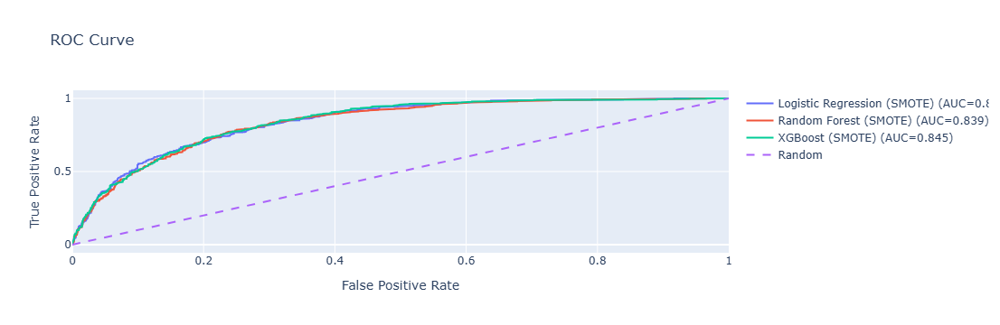

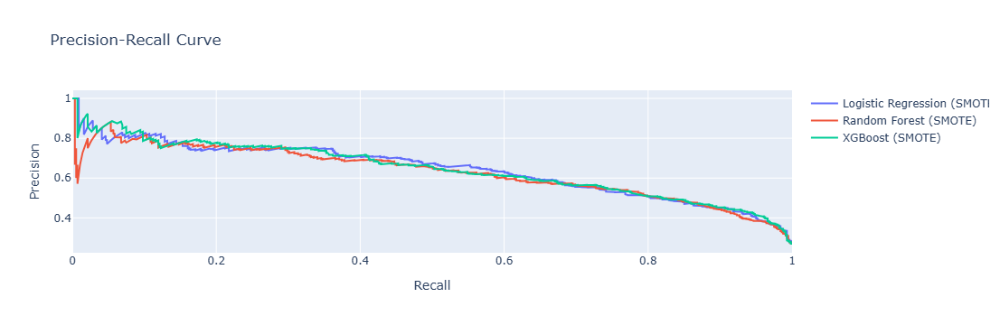

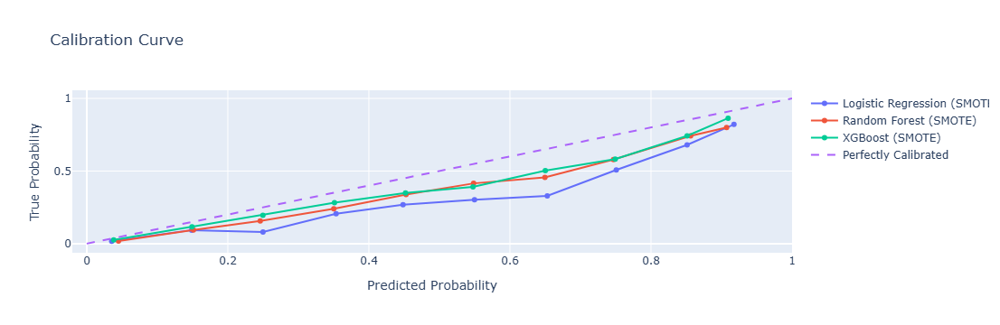

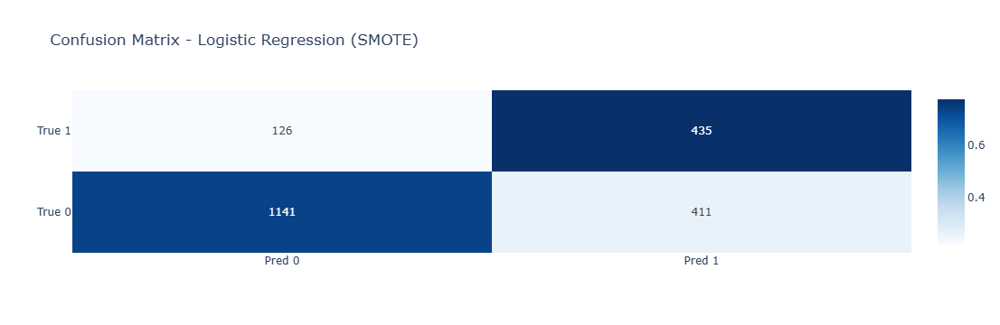

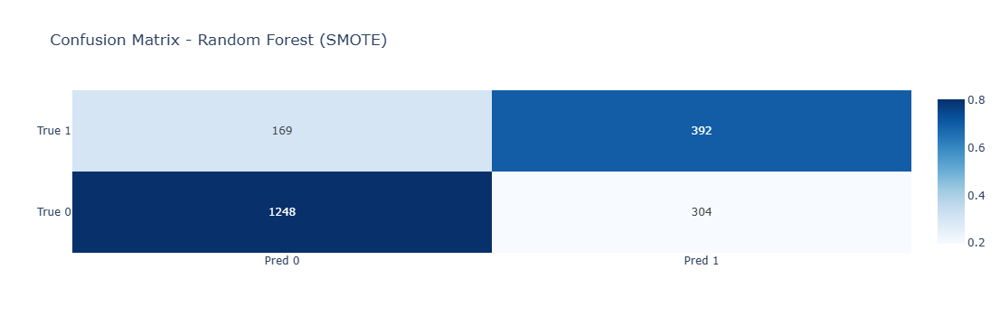

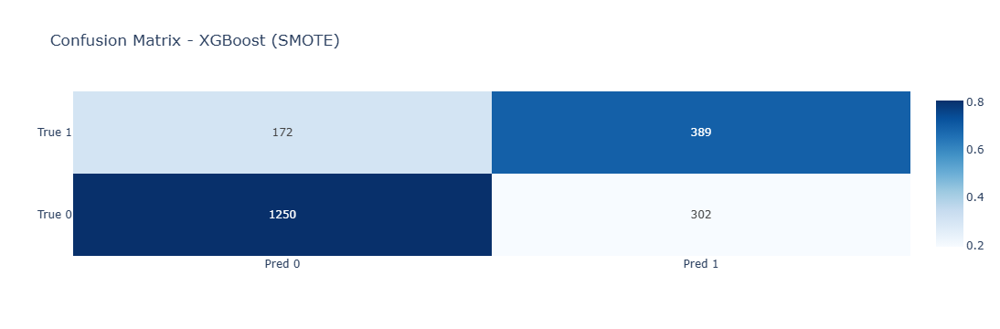

,Model,ROC_AUC
0,Logistic Regression (SMOTE),0.844119
1,Random Forest (SMOTE),0.839052
2,XGBoost (SMOTE),0.845179


In [68]:
# [86]: Model comparison (logs collinearity config + VIF artifacts) — WITH TAGS
with mlflow.start_run(run_name=f"model_comparison [{VARIANT}]"):
    mlflow.set_tags({
        "stage": "final_eval",
        "variant": VARIANT,
        "collinearity_mode": COLLINEARITY_MODE,
        "optimize_for": OPTIMIZE_FOR,
        "use_smote": str(USE_SMOTE),
        "cv_n_splits": str(N_SPLITS),
    })

    # Run plots + reports
    fig_roc, fig_pr, fig_cal, confusion_figs, compare_results = compare_models_plotly(
        best_models, X_test, y_test, log_to_mlflow=True
    )

    # Log model-level ROC AUCs (test)
    for _, row in compare_results.iterrows():
        safe_name = row['Model'].replace(" ", "_").replace("(", "").replace(")", "")
        mlflow.log_metric(f"ROC_AUC_{safe_name}", row['ROC_AUC'])

    # Log experiment config (params)
    mlflow.log_param("USE_SMOTE", USE_SMOTE)
    mlflow.log_param("LOG_TRIALS", LOG_TRIALS)
    mlflow.log_param("COLLINEARITY_MODE", COLLINEARITY_MODE)
    mlflow.log_param("VIF_THRESHOLD", VIF_THRESHOLD)
    mlflow.log_param("OPTIMIZE_FOR", OPTIMIZE_FOR)
    mlflow.log_param("CV_N_SPLITS", N_SPLITS)

    # Persist final VIF artifacts per model (if present)
    for name, model in best_models.items():
        steps = dict(model.named_steps)
        if 'vif' in steps:
            vif_step = steps['vif']
            with tempfile.TemporaryDirectory() as tmpdir:
                path = os.path.join(tmpdir, f'vif_final_{name}.csv')
                vif_step.vif_table_.to_csv(path, index=False)
                mlflow.log_artifact(path, artifact_path='collinearity')
                drop_path = os.path.join(tmpdir, f'dropped_{name}.txt')
                with open(drop_path, 'w') as f:
                    for feat in vif_step.dropped_features_:
                        f.write(str(feat) + '\n')
                mlflow.log_artifact(drop_path, artifact_path='collinearity')

# Show plots outside the MLflow run
fig_roc.show(); fig_pr.show(); fig_cal.show()
for _, cm_fig in confusion_figs: cm_fig.show()
compare_results


# 3. Variant Toggles

In [102]:
# === 8.0z Clustering toggles (independent from baseline) ===
USE_SMOTE_CLUSTER = False   # <- set True/False for clustering runs only
VARIANT_CLUSTER   = "SMOTE" if USE_SMOTE_CLUSTER else "Base"
print("Clustering variant:", VARIANT_CLUSTER)


Clustering variant: Base


# 4. Clustering - I

## 4.1 Train-only Encoding for Clustering

In [103]:
import numpy as np
from collections import Counter

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import (
    silhouette_score, davies_bouldin_score, calinski_harabasz_score,
    roc_auc_score, average_precision_score
)

# Search grid
CLUSTER_ALGOS = ("kmeans", "gmm")
K_RANGE = list(range(2, 8))  # k=2..7
CLUSTER_RANDOM_STATE = 42

# Train-only preprocessor for clustering (no target leakage)
cluster_preprocessor, _, _ = make_preprocessor(X_train)
cluster_preprocessor.fit(X_train)

# Encoded train/test for clustering
Xtr_enc = cluster_preprocessor.transform(X_train)
Xte_enc = cluster_preprocessor.transform(X_test)

# Ensure dense arrays for KMeans / GMM
if hasattr(Xtr_enc, "toarray"):
    Xtr_enc = Xtr_enc.toarray()
if hasattr(Xte_enc, "toarray"):
    Xte_enc = Xte_enc.toarray()


## 4.2 Cluster search (KMeans/GMM) + metrics

In [104]:
# === 8.1 Internal clustering search & selection (with MLflow logging) ===
import mlflow
from mlflow.tracking import MlflowClient
import pandas as pd
import tempfile, os, numpy as np
from collections import Counter
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

def _cluster_internal_metrics(X_enc, labels):
    sil = silhouette_score(X_enc, labels)
    db  = davies_bouldin_score(X_enc, labels)
    ch  = calinski_harabasz_score(X_enc, labels)
    return sil, db, ch

def run_cluster_search(X_enc, algos=CLUSTER_ALGOS, k_values=K_RANGE, variant=VARIANT_CLUSTER):
    records = []
    client = MlflowClient()
    _ = mlflow.get_experiment_by_name('telco-churn-optuna')  # ensure experiment exists

    for algo in algos:
        for k in k_values:
            with mlflow.start_run(run_name=f"cluster_{algo}_k={k} [{variant}]"):
                mlflow.set_tags({
                    "stage": "clustering",
                    "algorithm": algo,
                    "k": str(k),
                    "variant": variant,
                    "collinearity_mode": COLLINEARITY_MODE,
                })

                if algo == "kmeans":
                    model = KMeans(n_clusters=k, n_init=10, random_state=CLUSTER_RANDOM_STATE)
                    labels = model.fit_predict(X_enc)
                    inertia = float(model.inertia_)
                    sil, db, ch = _cluster_internal_metrics(X_enc, labels)

                    mlflow.log_metric("silhouette", sil)
                    mlflow.log_metric("davies_bouldin", db)
                    mlflow.log_metric("calinski_harabasz", ch)
                    mlflow.log_metric("inertia", inertia)
                    for cid, sz in Counter(labels).items():
                        mlflow.log_metric(f"size_cluster_{cid}", int(sz))

                    with tempfile.TemporaryDirectory() as td:
                        centers_path = os.path.join(td, f"kmeans_centers_k={k}.csv")
                        pd.DataFrame(model.cluster_centers_).to_csv(centers_path, index=False)
                        mlflow.log_artifact(centers_path, artifact_path="clusterer")

                    extra = {"inertia": inertia}

                else:  # GMM
                    model = GaussianMixture(
                        n_components=k, covariance_type="full",
                        reg_covar=1e-6, random_state=CLUSTER_RANDOM_STATE
                    )
                    model.fit(X_enc)
                    labels = model.predict(X_enc)
                    sil, db, ch = _cluster_internal_metrics(X_enc, labels)
                    bic = float(model.bic(X_enc))
                    aic = float(model.aic(X_enc))

                    mlflow.log_metric("silhouette", sil)
                    mlflow.log_metric("davies_bouldin", db)
                    mlflow.log_metric("calinski_harabasz", ch)
                    mlflow.log_metric("bic", bic)
                    mlflow.log_metric("aic", aic)
                    for cid, sz in Counter(labels).items():
                        mlflow.log_metric(f"size_cluster_{cid}", int(sz))

                    with tempfile.TemporaryDirectory() as td:
                        means_path = os.path.join(td, f"gmm_means_k={k}.csv")
                        pd.DataFrame(model.means_).to_csv(means_path, index=False)
                        mlflow.log_artifact(means_path, artifact_path="clusterer")

                    extra = {"bic": bic, "aic": aic}

                records.append({
                    "algo": algo, "k": k,
                    "silhouette": sil, "davies_bouldin": db, "calinski_harabasz": ch,
                    **extra, "model": model
                })

    # Selection: maximize silhouette, minimize DB; tiebreak → KMeans: lower inertia; GMM: lower BIC
    def sort_key(r):
        base = (r["silhouette"], -r["davies_bouldin"], r["calinski_harabasz"])
        if r["algo"] == "kmeans":
            tiebreak = (-r.get("inertia", np.inf),)
        else:
            tiebreak = (-r.get("bic", np.inf),)  # lower BIC is better
        return base + tiebreak

    best = sorted(records, key=sort_key, reverse=True)[0]
    return best, records

best_cluster_spec, cluster_grid = run_cluster_search(Xtr_enc, CLUSTER_ALGOS, K_RANGE, VARIANT_CLUSTER)
print("Selected clusterer:", best_cluster_spec["algo"], "k =", best_cluster_spec["k"], "| variant:", VARIANT_CLUSTER)


Selected clusterer: kmeans k = 2 | variant: Base


## 4.3 Router: per-cluster supervised models (frozen OHE)

In [105]:
# === Helper: clone the supervised preprocessor but freeze OHE categories (global schema) ===
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer

def _frozen_supervised_preprocessor(supervised_preprocessor_fitted: ColumnTransformer) -> ColumnTransformer:
    # pull the already-fitted global transformers’ column lists
    num_cols = supervised_preprocessor_fitted.transformers_[0][2] if supervised_preprocessor_fitted.transformers_ else None
    cat_cols = supervised_preprocessor_fitted.transformers_[1][2] if supervised_preprocessor_fitted.transformers_ else None
    assert num_cols is not None and cat_cols is not None, "Could not find num/cat transformers."

    # freeze categories from the global OHE
    global_ohe = supervised_preprocessor_fitted.named_transformers_["cat"]
    categories = getattr(global_ohe, "categories_", None)
    assert categories is not None, "Supervised preprocessor must be FIT on X_train."

    # handle sklearn version differences (sparse_output vs sparse)
    try:
        ohe = OneHotEncoder(categories=categories, drop="first",
                            handle_unknown="ignore", sparse_output=False)
    except TypeError:
        ohe = OneHotEncoder(categories=categories, drop="first",
                            handle_unknown="ignore", sparse=False)

    new_ct = ColumnTransformer(
        [("num", StandardScaler(), num_cols),
         ("cat", ohe, cat_cols)],
        remainder="drop",
    )
    return new_ct


In [106]:
from dataclasses import dataclass
import numpy as np

@dataclass
class ClusteredChurnModel:
    cluster_algo: str                 # "kmeans" | "gmm"
    clusterer: object                 # fitted KMeans/GMM on Xtr_enc
    cluster_preprocessor: object      # fitted cluster ColumnTransformer
    per_cluster_models: dict          # {cluster_id: sklearn Pipeline}

    def _cluster_assign(self, X):
        Xenc = self.cluster_preprocessor.transform(X)
        try:
            import scipy.sparse as sp
            if sp.issparse(Xenc):
                Xenc = Xenc.toarray()
        except Exception:
            pass
        return self.clusterer.predict(Xenc)

    def predict_proba(self, X):
        # GMM → soft routing; KMeans → hard routing
        if getattr(self.clusterer, "predict_proba", None) is not None and self.cluster_algo == "gmm":
            Xenc = self.cluster_preprocessor.transform(X)
            try:
                import scipy.sparse as sp
                if sp.issparse(Xenc):
                    Xenc = Xenc.toarray()
            except Exception:
                pass
            post = self.clusterer.predict_proba(Xenc)  # N x K
            cids = sorted(self.per_cluster_models.keys())
            mats = [self.per_cluster_models[cid].predict_proba(X)[:, 1] for cid in cids]
            M = np.vstack(mats).T  # N x K
            return (post[:, cids] * M).sum(axis=1)

        # KMeans hard routing
        labels = self._cluster_assign(X)
        proba = np.zeros(len(X), dtype=float)
        for cid, model in self.per_cluster_models.items():
            idx = np.where(labels == cid)[0]
            if len(idx):
                proba[idx] = model.predict_proba(X.iloc[idx])[:, 1]
        return proba

    def predict(self, X, threshold=0.5):
        p = self.predict_proba(X)
        return (p >= threshold).astype(int)


In [107]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

def build_clustered_router(
    best_spec,                   # from run_cluster_search
    preproc_for_cluster,         # fitted train-only cluster preprocessor
    results_dict,                # your global 'results' with best_params
    X_train, y_train,            # raw train
    Xtr_enc,                     # encoded train (dense) for clusterer
    supervised_preprocessor,     # FITTED global supervised preprocessor
    supervised_feature_names,    # names from supervised preprocessor
    use_smote=USE_SMOTE_CLUSTER  # cluster-only toggle (separate from baseline)
):
    # Choose the overall best supervised algo by your OPTIMIZE_FOR
    best_algo = max(results_dict, key=lambda a: results_dict[a]['best_score'])
    best_params = results_dict[best_algo]['best_params']

    if best_algo == 'logreg':
        if COLLINEARITY_MODE in ('elasticnet', 'both'):
            base_clf = LogisticRegression(max_iter=1000, solver='saga',
                                          penalty='elasticnet', random_state=42, **best_params)
        else:
            base_clf = LogisticRegression(max_iter=500, solver='liblinear',
                                          random_state=42, **best_params)
    elif best_algo == 'rf':
        base_clf = RandomForestClassifier(random_state=42, n_jobs=-1, **best_params)
    elif best_algo == 'xgb':
        base_clf = XGBClassifier(eval_metric='logloss', random_state=42, n_jobs=-1, **best_params)
    else:
        raise ValueError(f"Unknown algo in results: {best_algo}")

    # Freeze the supervised preprocessor to the global OHE schema
    frozen_supervised_pre = _frozen_supervised_preprocessor(supervised_preprocessor)

    cluster_algo = best_spec["algo"]
    clusterer = best_spec["model"]  # already fitted on Xtr_enc

    # Train one supervised model per cluster
    labels_tr = clusterer.predict(Xtr_enc)
    per_cluster_models = {}

    for cid in sorted(np.unique(labels_tr)):
        Xcid = X_train.iloc[labels_tr == cid]
        ycid = y_train.iloc[labels_tr == cid]

        # SMOTE safety for tiny clusters
        min_pos = int((ycid == 1).sum())
        min_neg = int((ycid == 0).sum())
        use_smote_here = bool(use_smote and (min_pos >= 6 and min_neg >= 6))

        # XGB class-imbalance tweak if SMOTE is not used
        clf = base_clf
        if (best_algo == 'xgb') and (not use_smote_here):
            pos = max(1, min_pos)
            neg = max(1, min_neg)
            spw = (neg / pos)
            clf = XGBClassifier(**{**base_clf.get_params(), "scale_pos_weight": spw})

        # Build collinearity-aware pipeline with frozen schema + aligner
        pipe = make_pipeline_with_collinearity(
            clf=clf,
            preprocessor=frozen_supervised_pre,
            feature_names=supervised_feature_names,
            use_smote=use_smote_here
        )
        pipe.fit(Xcid, ycid)
        per_cluster_models[int(cid)] = pipe

    return ClusteredChurnModel(
        cluster_algo=cluster_algo,
        clusterer=clusterer,
        cluster_preprocessor=preproc_for_cluster,
        per_cluster_models=per_cluster_models
    )


## 4.4 Clustered evaluation on test + MLflow logging

In [108]:
# === 8.3 Train router, evaluate downstream payoff, MLflow logging ===
import mlflow, joblib, tempfile, os
from sklearn.metrics import average_precision_score, roc_auc_score

# Build router (uses cluster-only SMOTE toggle)
router = build_clustered_router(
    best_cluster_spec,               # from run_cluster_search
    cluster_preprocessor,            # fitted clustering preprocessor
    results,                         # best_params from global Optuna
    X_train, y_train,                # raw train (unencoded)
    Xtr_enc,                         # encoded train for clusterer
    preprocessor, pre_feat_names,    # FITTED global supervised preprocessor + names
    use_smote=USE_SMOTE_CLUSTER      # <-- IMPORTANT: use the CLUSTER toggle
)

# Test evaluation
y_prob_clustered = router.predict_proba(X_test)
y_pred_clustered = (y_prob_clustered >= 0.5).astype(int)
test_pr_auc  = average_precision_score(y_test, y_prob_clustered)
test_roc_auc = roc_auc_score(y_test, y_prob_clustered)

# Per-cluster diagnostics (TEST)
labels_te = router._cluster_assign(X_test)
per_cluster_metrics = []
for cid in sorted(np.unique(labels_te)):
    mask = (labels_te == cid)
    if mask.sum() == 0:
        continue
    prc = average_precision_score(y_test[mask], y_prob_clustered[mask])
    roc = roc_auc_score(y_test[mask], y_prob_clustered[mask])
    per_cluster_metrics.append((int(cid), int(mask.sum()), float(prc), float(roc)))

print("Clustered model — TEST PR_AUC:", round(test_pr_auc, 4), "| ROC_AUC:", round(test_roc_auc, 4))
print("Per-cluster (id, n, PR_AUC, ROC_AUC):", per_cluster_metrics)

# Log clustering + downstream results
with mlflow.start_run(run_name=f"clustering_final_eval [{VARIANT_CLUSTER}]"):  # <-- use VARIANT_CLUSTER
    mlflow.set_tags({
        "stage": "clustering_final_eval",
        "cluster_algo": router.cluster_algo,
        "k": str(best_cluster_spec["k"]),
        "variant": VARIANT_CLUSTER,               # <-- use VARIANT_CLUSTER
        "collinearity_mode": COLLINEARITY_MODE,
        "optimize_for": OPTIMIZE_FOR,
        "use_smote": str(USE_SMOTE_CLUSTER),      # <-- use USE_SMOTE_CLUSTER
    })

    # Internal metrics on TRAIN for the selected clusterer
    tr_labels = router.clusterer.predict(Xtr_enc)
    sil = silhouette_score(Xtr_enc, tr_labels)
    db  = davies_bouldin_score(Xtr_enc, tr_labels)
    ch  = calinski_harabasz_score(Xtr_enc, tr_labels)
    mlflow.log_metric("cluster_silhouette_train", sil)
    mlflow.log_metric("cluster_db_train", db)
    mlflow.log_metric("cluster_ch_train", ch)
    if router.cluster_algo == "kmeans":
        mlflow.log_metric("kmeans_inertia", float(router.clusterer.inertia_))
    else:
        mlflow.log_metric("gmm_bic_train", float(router.clusterer.bic(Xtr_enc)))
        mlflow.log_metric("gmm_aic_train", float(router.clusterer.aic(Xtr_enc)))

    # Downstream metrics on TEST
    mlflow.log_metric("clustered_TEST_pr_auc", float(test_pr_auc))
    mlflow.log_metric("clustered_TEST_roc_auc", float(test_roc_auc))

    # Per-cluster breakdown
    for cid, n, prc, roc in per_cluster_metrics:
        mlflow.log_metric(f"test_size_cluster_{cid}", n)
        mlflow.log_metric(f"test_pr_auc_cluster_{cid}", prc)
        mlflow.log_metric(f"test_roc_auc_cluster_{cid}", roc)

    # Persist the router as an artifact
    with tempfile.TemporaryDirectory() as td:
        path = os.path.join(td, "clustered_router.joblib")
        joblib.dump(router, path)
        mlflow.log_artifact(path, artifact_path="models")


Clustered model — TEST PR_AUC: 0.6504 | ROC_AUC: 0.8385
Per-cluster (id, n, PR_AUC, ROC_AUC): [(0, 912, 0.5832412338310864, 0.8224261692620893), (1, 1201, 0.6957793752792378, 0.8545468137304871)]


## 4.5 Baseline vs Clustered PR_AUC Comparison

In [109]:
# Baseline (global) best — uses your Optuna 'results' and current pipeline builder
from sklearn.metrics import average_precision_score, roc_auc_score

best_algo = max(results, key=lambda a: results[a]['best_score'])
base_name, base_pipe = make_final_pipeline(best_algo, results[best_algo]['best_params'])
base_pipe.fit(X_train, y_train)
base_prob = base_pipe.predict_proba(X_test)[:, 1]

# Clustered (already computed in your flow)
clu_prob = y_prob_clustered

base_pr  = average_precision_score(y_test, base_prob)
base_roc = roc_auc_score(y_test, base_prob)
clu_pr   = average_precision_score(y_test, clu_prob)
clu_roc  = roc_auc_score(y_test, clu_prob)

print(f"Baseline PR_AUC={base_pr:.4f} | ROC_AUC={base_roc:.4f}")
print(f"Clustered PR_AUC={clu_pr:.4f} | ROC_AUC={clu_roc:.4f}")
print(f"Δ PR_AUC={clu_pr - base_pr:+.4f} | Δ ROC_AUC={clu_roc - base_roc:+.4f}")


Baseline PR_AUC=0.6469 | ROC_AUC=0.8447
Clustered PR_AUC=0.6504 | ROC_AUC=0.8385
Δ PR_AUC=+0.0034 | Δ ROC_AUC=-0.0062


## 4.6 Double Checking Tiny Clustering Uplift

In [110]:
# Bootstrap 95% CI for PR-AUC delta (clustered - baseline)
import numpy as np
from sklearn.metrics import average_precision_score, roc_auc_score

rng = np.random.default_rng(42)
B = 2000
n = len(y_test)
deltas = np.empty(B)
for b in range(B):
    idx = rng.integers(0, n, n)
    deltas[b] = (average_precision_score(y_test.iloc[idx], y_prob_clustered[idx])
                 - average_precision_score(y_test.iloc[idx], base_prob[idx]))
lo, hi = np.percentile(deltas, [2.5, 97.5])
print(f"ΔPR-AUC mean={deltas.mean():.4f}, 95% CI=({lo:.4f}, {hi:.4f})")


ΔPR-AUC mean=0.0039, 95% CI=(-0.0110, 0.0193)


# 5. Clustering - II (with PCA)

In [135]:
# =========================
# 5.0 Clustering (PCA) — Toggles
# =========================
from sklearn.decomposition import PCA

# Turn PCA-based clustering on/off
USE_CLUSTER_PCA = True

# Flexible: if int -> number of components; if float in (0,1] -> variance target
# e.g., 0.95 keeps enough components to explain 95% variance
CLUSTER_PCA_COMPONENTS = 0.95
CLUSTER_PCA_WHITEN = False

# Search grid for k and algorithms (reuses your earlier random_state=42)
CLUSTER_K_GRID = [2, 3, 4, 5, 6]
CLUSTER_ALGOS = ["kmeans", "gmm"]  # both KMeans and GaussianMixture


In [136]:
# =========================
# 5.1 Cluster feature preprocessor (PCA)
# =========================
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

def make_cluster_preprocessor_pca(X, n_components=0.95, whiten=False):
    """
    Build a clustering-only preprocessor:
    - Standardize numeric, one-hot categorical (dense)
    - PCA on the combined dense feature space
    This does NOT affect your supervised preprocessor/pipelines.
    """
    bool_cols = X.select_dtypes(include=['bool']).columns.tolist()
    num_cols  = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cat_cols  = X.select_dtypes(include=['object']).columns.tolist() + bool_cols

    # Keep output dense to feed PCA
    ohe_kwargs = dict(drop='first', handle_unknown='ignore')
    try:
        if 'sparse_output' in OneHotEncoder().get_params():
            ohe_kwargs['sparse_output'] = False  # sklearn >= 1.2
        else:
            ohe_kwargs['sparse'] = False         # sklearn < 1.2
    except Exception:
        ohe_kwargs['sparse'] = False

    coltx = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), num_cols),
            ('cat', OneHotEncoder(**ohe_kwargs), cat_cols),
        ],
        remainder='drop'
    )

    pca = PCA(n_components=n_components, whiten=whiten, random_state=42)
    cluster_preprocessor = Pipeline([
        ('prep', coltx),
        ('pca', pca),
    ])
    return cluster_preprocessor


In [137]:
# =========================
# 5.2 Encode TRAIN for clustering (PCA space)
# =========================
if USE_CLUSTER_PCA:
    cluster_preprocessor_pca = make_cluster_preprocessor_pca(
        X_train, n_components=CLUSTER_PCA_COMPONENTS, whiten=CLUSTER_PCA_WHITEN
    )
    Xtr_enc_pca = cluster_preprocessor_pca.fit_transform(X_train)
    # Optional: quick peek at dimensionality
    print("PCA feature shape (TRAIN):", Xtr_enc_pca.shape)
else:
    cluster_preprocessor_pca = None
    Xtr_enc_pca = None


PCA feature shape (TRAIN): (4930, 18)


In [138]:
# =========================
# 5.3 Search clusters (PCA space)
# =========================
import numpy as np
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

def evaluate_clusters(X_enc, algo, k):
    """
    Fit a clusterer and compute quality metrics on TRAIN encoding.
    Returns: (clusterer, labels, metrics_dict)
    """
    if algo == "kmeans":
        clus = KMeans(n_clusters=k, n_init=10, random_state=42)
        labels = clus.fit_predict(X_enc)
        metrics = {"inertia": float(clus.inertia_)}
    elif algo == "gmm":
        clus = GaussianMixture(n_components=k, covariance_type="full", random_state=42)
        labels = clus.fit_predict(X_enc)
        metrics = {
            "bic": float(clus.bic(X_enc)),
            "aic": float(clus.aic(X_enc)),
        }
    else:
        raise ValueError(algo)

    # Common clustering metrics
    sil = silhouette_score(X_enc, labels)
    db  = davies_bouldin_score(X_enc, labels)
    ch  = calinski_harabasz_score(X_enc, labels)
    metrics.update({
        "silhouette": float(sil),
        "davies_bouldin": float(db),      # lower is better
        "calinski_harabasz": float(ch),   # higher is better
    })
    return clus, labels, metrics

def pick_best_cluster_spec(results_list):
    """
    Choose by:
      1) max silhouette
      2) tie-breaker: min Davies–Bouldin
      3) tie-breaker: max Calinski–Harabasz
    """
    def sort_key(d):
        m = d["metrics"]
        return (m["silhouette"], -m["davies_bouldin"], m["calinski_harabasz"])
    return sorted(results_list, key=sort_key, reverse=True)[0]

# Run search
if USE_CLUSTER_PCA:
    cluster_search_pca = []
    for algo in CLUSTER_ALGOS:
        for k in CLUSTER_K_GRID:
            try:
                clus, labels, mets = evaluate_clusters(Xtr_enc_pca, algo, k)
                cluster_search_pca.append({
                    "algo": algo,
                    "k": k,
                    "clusterer": clus,
                    "labels": labels,
                    "metrics": mets,
                    "feature_space": "pca",  # hint for downstream logging
                })
                print(f"[{algo} | k={k}] sil={mets['silhouette']:.3f}, DB={mets['davies_bouldin']:.3f}, CH={mets['calinski_harabasz']:.1f}")
            except Exception as e:
                print(f"[Skip] {algo} k={k} failed: {e}")

    assert cluster_search_pca, "No successful cluster fits in PCA space. Check data/preprocessor settings."

    best_cluster_spec_pca = pick_best_cluster_spec(cluster_search_pca)
    # --- alias for router compatibility ---
    best_cluster_spec_pca["model"] = best_cluster_spec_pca["clusterer"]

    print("Best (PCA) →", best_cluster_spec_pca["algo"], "k=", best_cluster_spec_pca["k"],
          "| sil=", round(best_cluster_spec_pca["metrics"]["silhouette"], 3))
else:
    best_cluster_spec_pca = None


[kmeans | k=2] sil=0.194, DB=1.931, CH=1286.0
[kmeans | k=3] sil=0.152, DB=2.093, CH=994.1
[kmeans | k=4] sil=0.166, DB=1.909, CH=851.0
[kmeans | k=5] sil=0.136, DB=1.870, CH=755.5
[kmeans | k=6] sil=0.128, DB=2.059, CH=684.2
[gmm | k=2] sil=0.149, DB=2.040, CH=1001.2
[gmm | k=3] sil=0.129, DB=2.392, CH=804.9
[gmm | k=4] sil=0.138, DB=2.123, CH=631.1
[gmm | k=5] sil=0.105, DB=2.670, CH=566.4
[gmm | k=6] sil=0.130, DB=2.282, CH=572.1
Best (PCA) → kmeans k= 2 | sil= 0.194


In [139]:
# =========================
# 5.4 Build router (PCA space) + evaluate + MLflow log  [FIXED + POST-PATCH]
# =========================
import os, tempfile, joblib, mlflow, numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import average_precision_score, roc_auc_score, silhouette_score, davies_bouldin_score, calinski_harabasz_score

def _ensure_aligner(pipe):
    """If the final step is XGB and there's no 'align' step, insert it right before 'clf'."""
    try:
        steps = list(pipe.steps)  # works for sklearn Pipeline and imblearn Pipeline
        names = [n for n, _ in steps]
        # find clf
        if 'clf' not in names:
            return pipe
        clf = pipe.named_steps['clf']
        if not isinstance(clf, XGBClassifier):
            return pipe
        if 'align' in names:
            return pipe
        # insert aligner just before clf
        clf_idx = names.index('clf')
        steps.insert(clf_idx, ('align', FeatureCountAligner()))
        # rebuild the same kind of pipeline (sklearn or imblearn)
        if hasattr(pipe, '_samplers'):  # crude way to detect imblearn.Pipeline
            return ImbPipeline(steps)
        else:
            return Pipeline(steps)
    except Exception:
        return pipe  # fail-safe: don't break flow

if USE_CLUSTER_PCA and best_cluster_spec_pca is not None:
    # Harmonize key expected by router
    if "model" not in best_cluster_spec_pca and "clusterer" in best_cluster_spec_pca:
        best_cluster_spec_pca = {**best_cluster_spec_pca, "model": best_cluster_spec_pca["clusterer"]}

    # Build router
    router_pca = build_clustered_router(
        best_cluster_spec_pca,                 # {"algo","k","model",...}
        cluster_preprocessor_pca,              # PCA preprocessor (fit on TRAIN)
        results,                               # best Optuna params per algo (already computed)
        X_train, y_train, Xtr_enc_pca,         # raw TRAIN (for per-cluster supervised), PCA-encoded TRAIN (for clusterer)
        preprocessor, pre_feat_names,          # global supervised preprocessor + names
        use_smote=USE_SMOTE
    )

    # --- POST-PATCH per-cluster models to guarantee aligner for XGB ---
    if hasattr(router_pca, "models"):
        for cid, mdl in list(router_pca.models.items()):
            router_pca.models[cid] = _ensure_aligner(mdl)

    # Evaluate on TEST
    y_prob_clustered_pca = router_pca.predict_proba(X_test)
    y_pred_clustered_pca = (y_prob_clustered_pca >= 0.5).astype(int)
    test_pr_auc_pca  = average_precision_score(y_test, y_prob_clustered_pca)
    test_roc_auc_pca = roc_auc_score(y_test, y_prob_clustered_pca)

    # Per-cluster breakdown (on TEST)
    labels_te = router_pca._cluster_assign(X_test)
    per_cluster_metrics = []
    for cid in sorted(np.unique(labels_te)):
        mask = (labels_te == cid)
        if mask.sum() == 0:
            continue
        prc = average_precision_score(y_test[mask], y_prob_clustered_pca[mask])
        roc = roc_auc_score(y_test[mask], y_prob_clustered_pca[mask])
        per_cluster_metrics.append((int(cid), int(mask.sum()), float(prc), float(roc)))

    print("[PCA] Clustered TEST — PR_AUC:", round(test_pr_auc_pca, 4), "| ROC_AUC:", round(test_roc_auc_pca, 4))
    print("[PCA] Per-cluster (id, n, PR_AUC, ROC_AUC):", per_cluster_metrics)

    # Log with PCA-specific tags/metrics
    with mlflow.start_run(run_name=f"clustering_final_eval_PCA [{VARIANT}]"):
        mlflow.set_tags({
            "stage": "clustering_final_eval",
            "cluster_algo": router_pca.cluster_algo,
            "cluster_feature_space": "pca",
            "variant": VARIANT,
            "collinearity_mode": COLLINEARITY_MODE,
            "optimize_for": OPTIMIZE_FOR,
            "use_smote": str(USE_SMOTE),
        })
        # PCA metadata
        pca_obj = cluster_preprocessor_pca.named_steps['pca']
        n_comp_used = getattr(pca_obj, "n_components_", CLUSTER_PCA_COMPONENTS)
        mlflow.log_param("pca_components_used", str(n_comp_used))
        exp_var = getattr(pca_obj, "explained_variance_ratio_", None)
        if exp_var is not None:
            mlflow.log_metric("pca_cum_explained_var", float(np.cumsum(exp_var)[-1]))

        # Cluster metrics on TRAIN (PCA space)
        tr_labels = router_pca.clusterer.predict(Xtr_enc_pca)
        sil = silhouette_score(Xtr_enc_pca, tr_labels)
        db  = davies_bouldin_score(Xtr_enc_pca, tr_labels)
        ch  = calinski_harabasz_score(Xtr_enc_pca, tr_labels)
        mlflow.log_metric("cluster_silhouette_train", sil)
        mlflow.log_metric("cluster_db_train", db)
        mlflow.log_metric("cluster_ch_train", ch)
        if router_pca.cluster_algo == "kmeans":
            mlflow.log_metric("kmeans_inertia", float(router_pca.clusterer.inertia_))
        else:
            mlflow.log_metric("gmm_bic_train", float(router_pca.clusterer.bic(Xtr_enc_pca)))
            mlflow.log_metric("gmm_aic_train", float(router_pca.clusterer.aic(Xtr_enc_pca)))

        # Downstream TEST metrics
        mlflow.log_metric("clustered_TEST_pr_auc", float(test_pr_auc_pca))
        mlflow.log_metric("clustered_TEST_roc_auc", float(test_roc_auc_pca))
        for cid, n, prc, roc in per_cluster_metrics:
            mlflow.log_metric(f"test_size_cluster_{cid}", n)
            mlflow.log_metric(f"test_pr_auc_cluster_{cid}", prc)
            mlflow.log_metric(f"test_roc_auc_cluster_{cid}", roc)

        # Save router as artifact
        with tempfile.TemporaryDirectory() as td:
            path = os.path.join(td, "clustered_router_pca.joblib")
            joblib.dump(router_pca, path)
            mlflow.log_artifact(path, artifact_path="models")
else:
    print("PCA clustering disabled (USE_CLUSTER_PCA=False).")


[PCA] Clustered TEST — PR_AUC: 0.4688 | ROC_AUC: 0.7655
[PCA] Per-cluster (id, n, PR_AUC, ROC_AUC): [(0, 908, 0.4541236822273931, 0.7598006644518271), (1, 1205, 0.6843688992728719, 0.8528467703405627)]


## Sanity Check

In [140]:
# --- Quick diagnostics for PCA-clustered evaluation ---
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score, roc_auc_score, brier_score_loss

# Confirm shapes and ranges
assert y_prob_clustered_pca.shape == y_test.shape, "shape mismatch"
assert np.isfinite(y_prob_clustered_pca).all(), "NaNs in probs"
assert (y_prob_clustered_pca >= 0).all() and (y_prob_clustered_pca <= 1).all(), "probs out of [0,1]"

# Cluster prevalence + metrics
labels_te = router_pca._cluster_assign(X_test)
rows = []
for cid in sorted(np.unique(labels_te)):
    m = labels_te == cid
    pos_rate = float(y_test[m].mean()) if m.sum() else np.nan
    ap = average_precision_score(y_test[m], y_prob_clustered_pca[m]) if m.sum() else np.nan
    auroc = roc_auc_score(y_test[m], y_prob_clustered_pca[m]) if m.sum() else np.nan
    brier = brier_score_loss(y_test[m], y_prob_clustered_pca[m]) if m.sum() else np.nan
    rows.append(dict(cluster=int(cid), n=int(m.sum()), pos_rate=pos_rate, pr_auc=ap, roc_auc=auroc, brier=brier))
diag = pd.DataFrame(rows).sort_values("cluster").reset_index(drop=True)

# Show "naive weighted" PR-AUC (for illustration only; not equal to pooled AP)
w_pr = np.average(diag["pr_auc"], weights=diag["n"])
print("Pooled PR-AUC (true):", round(average_precision_score(y_test, y_prob_clustered_pca), 4))
print("Naive size-weighted PR-AUC (illustrative):", round(w_pr, 4))
diag


Pooled PR-AUC (true): 0.4688
Naive size-weighted PR-AUC (illustrative): 0.5854


,cluster,n,pos_rate,pr_auc,roc_auc,brier
0,0,908,0.236784,0.454124,0.759801,0.336014
1,1,1205,0.287137,0.684369,0.852847,0.144243


# Appendix

## UI Cleanup -- One time requirement

In [50]:
'''import mlflow
from mlflow.tracking import MlflowClient

mlflow.set_tracking_uri("file:///C:/Users/argon/Documents/Desktop Prime/MS Business Analytics/mlruns")
EXP_NAME = "telco-churn-optuna"

client = MlflowClient()
exp = mlflow.get_experiment_by_name(EXP_NAME)
latest = client.search_runs(
    [exp.experiment_id],
    order_by=["attributes.start_time DESC"],
    max_results=1
)[0]

# Derive variant from the logged param
use_smote = str(latest.data.params.get("USE_SMOTE", "False")).lower()
variant = "SMOTE" if use_smote in ("true", "1", "yes") else "Base"

# Set tags so it matches your new strategy
client.set_tag(latest.info.run_id, "variant", variant)
client.set_tag(latest.info.run_id, "stage", "final_eval")  # if this run is your comparison run

# (Nice) rename in UI to include the variant
run_name = latest.data.tags.get("mlflow.runName", latest.info.run_id)
if f"[{variant}]" not in run_name:
    client.set_tag(latest.info.run_id, "mlflow.runName", f"{run_name} [{variant}]")

print("Tagged:", latest.info.run_id, "→", variant)'''


Tagged: 99af80e8a8ec47beac108932ffe2b184 → Base


## Backfilling best PR_AUC

In [69]:
# Backfill BEST_PR_AUC metrics into the latest model_comparison runs for BOTH variants (no re-train)
import mlflow
from mlflow.tracking import MlflowClient

mlflow.set_tracking_uri("file:///C:/Users/argon/Documents/Desktop Prime/MS Business Analytics/mlruns")
EXPERIMENT_NAME = "telco-churn-optuna"

client = MlflowClient()
exp = mlflow.get_experiment_by_name(EXPERIMENT_NAME)
assert exp is not None, f"Experiment not found: {EXPERIMENT_NAME}"

algo_to_pretty = {
    "logreg": "Logistic_Regression",
    "rf": "Random_Forest",
    "xgb": "XGBoost",
}

def find_final_eval_run(exp_id: str, variant: str):
    # Preferred: tagged final_eval for this variant
    runs = client.search_runs(
        [exp_id],
        filter_string=f'tags.stage = "final_eval" and tags.variant = "{variant}"',
        order_by=["attributes.start_time DESC"],
        max_results=1
    )
    if runs:
        return runs[0]
    # Fallback: by run name containing "model_comparison" and optional [Variant]
    name_filter = f'attributes.run_name LIKE "model_comparison%{variant}%"' if variant in ("Base", "SMOTE") else 'attributes.run_name LIKE "model_comparison%"'
    runs = client.search_runs(
        [exp_id],
        filter_string=name_filter,
        order_by=["attributes.start_time DESC"],
        max_results=1
    )
    return runs[0] if runs else None

def find_optuna_best_run(exp_id: str, algo: str, variant: str):
    # Preferred: tagged optuna_best for this variant & algo
    runs = client.search_runs(
        [exp_id],
        filter_string=f'tags.stage = "optuna_best" and tags.algorithm = "{algo}" and tags.variant = "{variant}"',
        order_by=["attributes.start_time DESC"],
        max_results=1
    )
    if runs:
        return runs[0]
    # Fallback: run_name pattern like "<algo>_best"
    runs = client.search_runs(
        [exp_id],
        filter_string=f'attributes.run_name LIKE "{algo}_best%"',
        order_by=["attributes.start_time DESC"],
        max_results=1
    )
    return runs[0] if runs else None

def backfill_for_variant(variant: str):
    final_run = find_final_eval_run(exp.experiment_id, variant)
    if not final_run:
        print(f"[Skip] No final_eval run found for variant={variant}.")
        return
    final_run_id = final_run.info.run_id
    print(f"[Target] final_eval run for {variant}: {final_run_id}")

    for algo, pretty in algo_to_pretty.items():
        best_run = find_optuna_best_run(exp.experiment_id, algo, variant)
        if not best_run:
            print(f"  [Skip] No optuna_best run found for algo={algo}, variant={variant}")
            continue
        best_pr = best_run.data.metrics.get("best_pr_auc")
        if best_pr is None:
            print(f"  [Skip] best_pr_auc not logged for algo={algo} (run_id={best_run.info.run_id})")
            continue

        key = f"BEST_PR_AUC_{pretty if variant=='Base' else pretty + '_SMOTE'}"
        client.log_metric(final_run_id, key, float(best_pr))
        print(f"  [OK] {key} = {best_pr:.6f} → final_eval {final_run_id}")

# Run backfill for BOTH variants regardless of current USE_SMOTE
for v in ("Base", "SMOTE"):
    backfill_for_variant(v)


[Target] final_eval run for Base: f67829768e26451093cb4d39374dc0dc
  [OK] BEST_PR_AUC_Logistic_Regression = 0.659931 → final_eval f67829768e26451093cb4d39374dc0dc
  [OK] BEST_PR_AUC_Random_Forest = 0.662021 → final_eval f67829768e26451093cb4d39374dc0dc
  [OK] BEST_PR_AUC_XGBoost = 0.673012 → final_eval f67829768e26451093cb4d39374dc0dc
[Target] final_eval run for SMOTE: bea25e2f7fbc439a9ee35f280a9a2980
  [OK] BEST_PR_AUC_Logistic_Regression_SMOTE = 0.659645 → final_eval bea25e2f7fbc439a9ee35f280a9a2980
  [OK] BEST_PR_AUC_Random_Forest_SMOTE = 0.650729 → final_eval bea25e2f7fbc439a9ee35f280a9a2980
  [OK] BEST_PR_AUC_XGBoost_SMOTE = 0.667323 → final_eval bea25e2f7fbc439a9ee35f280a9a2980
